# 2024-03-28 30v3 - Implementing gridsearch and analyzing its impact-- REBUTTALS.ipynb
Clone of `2024-01-30 30 - Implementing gridsearch and analyzing its impact.ipynb`. This is the main notebook for the generation of new plots and tables for the rebuttal requests. 

The plan is to include: 
- New models (iTransformer, Pyraformer, etc)
- New datasets (ETTh,ETTm, illness, traffic)
- Some cleanup specific to the new datasets and models.
- New plots and tables to satisfy reviewers requests
- Cleanups and refactors to common data processing and plot functions.

## Parameters

In [1]:
# Needed to filter on the gridsearch
CONSTRAINT_TYPE='constant'
#CONSTRAINT_TYPE='monotonic'

Folder name

In [2]:
import datetime
import os 

today = datetime.date.today()
formatted_date = today.strftime("%Y-%m-%d")

# Figures will be stored here.
FIGURES_FOLDER = f"../figures/icml_monotonic_{formatted_date}"


os.makedirs(FIGURES_FOLDER, exist_ok=True)
FIGURES_FOLDER

'../figures/icml_monotonic_2024-04-16'

## Libraries and setup

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
import sys
import os
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), os.pardir)))

In [5]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import matplotlib as mpl
import seaborn as sns
from IPython.display import display, Markdown, Latex

In [6]:
from utils import wandb_utils

## Data loading
From the cached pkl files. If they break, use the CSV ones.

### Resilience data
The original resilience runs from the paper are in this dataset. Rebuttal runs did not have resilience as of march 28 morning.
### Non resilience data
Original experiment data including non-resilience constant-$\epsilon$ runs

In [7]:
#CONSTRAINT_TYPE='constant' #TODO see if we will need this.

# Resilience runs will be merged later to the df.
real_df_resilience = pd.read_pickle("../data_backups/2024_02_01_1038am__icml_backup_data.pkl")
real_df_resilience = real_df_resilience.query('constraint_type=="constant_resilience" or constraint_type=="erm"')

# Real data is the original set of runs
#real_df = pd.read_pickle("../data_backups/2024_02_01_1038am__icml_backup_data.pkl")
real_df = pd.read_pickle("../data_backups/2024_03_29__original_experiments.pkl") # New dataset with updated loader
real_df = real_df.query('constraint_type=="constant" or constraint_type=="erm"')

# These two are the rebuttal runs
real_df_newdatasets = pd.read_pickle("../data_backups/2024_03_28__newdatasets_erm_and_constrained.pkl")
# Filter unused models or wrongly tagged
real_df_newmodels = pd.read_pickle("../data_backups/2024_03_28__newmodels_erm_and_constrained.pkl") \
        .query('model!="TimesNet"') \
        .query('model!="Transformer"') \
        .query('model!="Reformer"') \
        .query('model!="Autoformer"') \
        .copy()

# Add all except resilience for now
df = pd.concat([real_df,real_df_newmodels,real_df_newdatasets], ignore_index=True,axis=0)

display(real_df_resilience[['constraint_type','resilient_lr']].drop_duplicates())
display(df.head())

,constraint_type,resilient_lr
169344,constant_resilience,0.1
764640,erm,NaN


,des,gpu,itr,d_ff,data,freq,loss,seed,c_out,embed,...,seg_len,multistep,task_name,hidden_dim,num_blocks,dynamic_dim,num_kernels,hidden_layers,p_hidden_dims,p_hidden_layers
0,Constrained loose weather.csv Informer 336 seed1.,0,1,2048,custom,h,mse,6163,21,timeF,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Constrained loose weather.csv Informer 336 seed1.,0,1,2048,custom,h,mse,6163,21,timeF,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Constrained loose weather.csv Informer 336 seed1.,0,1,2048,custom,h,mse,6163,21,timeF,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Constrained loose weather.csv Informer 336 seed1.,0,1,2048,custom,h,mse,6163,21,timeF,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Constrained loose weather.csv Informer 336 seed1.,0,1,2048,custom,h,mse,6163,21,timeF,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### ALTERNATIVE DATALOADING: MONOTONIC + RESILIENCE
For some ad hoc plots required by the rebuttal.

In [8]:
# #CONSTRAINT_TYPE='constant' #TODO see if we will need this.


# # Real data is the original set of runs
# #real_df = pd.read_pickle("../data_backups/2024_02_01_1038am__icml_backup_data.pkl")
# real_df = pd.read_pickle("../data_backups/2024_03_29__original_monotonic_plus_erm.pkl") # New dataset with updated loader

# real_df_resilience = real_df.query("constraint_type=='monotonic_resilience' or constraint_type=='erm'")
# real_df_resilience = real_df_resilience.query('constraint_type=="monotonic_resilience" or constraint_type=="erm"')

# real_df = real_df.query('constraint_type=="monotonic" or constraint_type=="erm"')
# df = real_df

# display(real_df_resilience[['constraint_type','resilient_lr']].drop_duplicates())
# display(df[['constraint_type','resilient_lr']].drop_duplicates())
# display(df.head())

In [8]:
df.constraint_type.unique()

array(['constant', 'erm'], dtype=object)

In [9]:
real_df_newmodels.groupby(['model','constraint_type'])['run_id'].nunique().reset_index()

,model,constraint_type,run_id
0,FiLM,constant,24
1,FiLM,erm,16
2,Informer,constant,36
3,Nonstationary_Transformer,constant,57
4,Nonstationary_Transformer,erm,16
5,Pyraformer,constant,57
6,Pyraformer,erm,23
7,iTransformer,constant,34
8,iTransformer,erm,12


### (newmodels) Debug

In [10]:
display(real_df_newdatasets.constraint_type.unique())
real_df_newdatasets.groupby(['data_path','model','pred_len','seed','constraint_type'])['run_id'].nunique().reset_index().sort_values('run_id',ascending=True)

array(['constant', 'erm'], dtype=object)

,data_path,model,pred_len,seed,constraint_type,run_id
95,ETTm1.csv,Transformer,720,2021,erm,1
124,ETTm2.csv,Transformer,336,2021,constant,1
123,ETTm2.csv,Transformer,192,2021,erm,1
121,ETTm2.csv,Transformer,96,2021,erm,1
119,ETTm2.csv,Reformer,720,2021,erm,1
...,...,...,...,...,...,...
104,ETTm2.csv,Informer,96,2021,constant,3
102,ETTm2.csv,Autoformer,720,2021,constant,3
46,ETTh2.csv,Informer,720,2021,constant,3
98,ETTm2.csv,Autoformer,192,2021,constant,3


In [12]:
display(real_df_newmodels.constraint_type.unique())
real_df_newmodels.groupby(['data_path','model','pred_len','seed'])['run_id'].nunique().reset_index().sort_values('run_id',ascending=True)

array(['constant', 'erm'], dtype=object)

,data_path,model,pred_len,seed,run_id
65,exchange_rate.csv,Pyraformer,96,1711160126,1
83,traffic.csv,Nonstationary_Transformer,192,1711186078,1
81,traffic.csv,Nonstationary_Transformer,96,1711184315,1
79,traffic.csv,FiLM,720,1711458193,1
78,traffic.csv,FiLM,336,1711411084,1
...,...,...,...,...,...
119,weather.csv,Pyraformer,336,2021,6
117,weather.csv,Pyraformer,192,2021,6
20,electricity.csv,Nonstationary_Transformer,96,2021,6
24,electricity.csv,Nonstationary_Transformer,336,2021,6


In [11]:
df.groupby(['data_path','model','pred_len','seed'])['run_id'].nunique().reset_index().sort_values('run_id',ascending=True)

,data_path,model,pred_len,seed,run_id
155,exchange_rate.csv,Informer,720,6163,1
137,exchange_rate.csv,Autoformer,336,6163,1
139,exchange_rate.csv,Autoformer,720,6163,1
141,exchange_rate.csv,FiLM,96,1711288809,1
143,exchange_rate.csv,FiLM,192,1711289071,1
...,...,...,...,...,...
263,weather.csv,Informer,96,2021,7
70,electricity.csv,Autoformer,720,2021,7
178,exchange_rate.csv,Reformer,192,2021,7
64,electricity.csv,Autoformer,96,2021,7


### Summary of runs per dataset

In [12]:
# If there are not seven runs per set (6 constrained and one erm) means probably missing runs.
# As of march 28 there are some missing runs but we'll leave it like that for now.
runs_per_groupset=df.groupby(['data_path','model','pred_len','seed'])['run_id'].nunique().reset_index()
runs_per_groupset[runs_per_groupset.run_id!=7]

,data_path,model,pred_len,seed,run_id
0,ETTh1.csv,Autoformer,96,2021,4
1,ETTh1.csv,Autoformer,192,2021,4
2,ETTh1.csv,Autoformer,336,2021,4
3,ETTh1.csv,Autoformer,720,2021,4
4,ETTh1.csv,Informer,96,2021,4
...,...,...,...,...,...
306,weather.csv,iTransformer,192,1711477522,1
307,weather.csv,iTransformer,336,2021,3
308,weather.csv,iTransformer,336,1711477724,1
309,weather.csv,iTransformer,720,2021,3


## Data processing
This section contains processing specific to this experiment set. If you clone this notebook. Remove or refactor this section.

In [15]:
# TODO preprocessing here.

### Gridsearch function (todo extract into script)
Meant to be used on `df_constrained` (containing only constant constrained `df`)

In [13]:
def gridsearch(runs_df, objective_col, gridsearch_keys, reference_cols, split='val',mode='mean'):
    """
    Performs a gridsearch across the runs under `gridsearch_keys`, with the objective of minimizing `objective_col`.
    
    Parameters
    ---
    mode: is either 'mean' or 'std', to choose which statistic of the objective value to use for the gridsearch.
    
    Returns 
    ---
    
        the runs_df filtered by the best runs, and the summary metric of the best runs.
    """
    grouped_cols = gridsearch_keys + reference_cols + ['constraint_level'] #todo maybe don't need to hardcode this
    summary_metric = objective_col

    run_gridsearch_stats = runs_df.query(f"split=='{split}'").groupby(grouped_cols).agg(
        mean_objective=(objective_col, 'mean'),
        std_objective=(objective_col, 'std'),
        #mean_constraint_violation=('constraint_violation', 'mean'), #is it worth having other stuff here?
        count=('step', 'size')
    ).reset_index().sort_values(['model', 'std_objective'])

    best_runs = run_gridsearch_stats.groupby(gridsearch_keys)[f'{mode}_objective'].idxmin()
    best_runs_df = run_gridsearch_stats.loc[best_runs, :]
    filtered_runs_df = runs_df[runs_df['run_id'].isin(best_runs_df['run_id'].unique())] #TODO run_id is a hard requirement in the group cols.

    return filtered_runs_df, best_runs_df[grouped_cols + [f'{mode}_objective']]

### Label constraint_levels (`constraint_idx` column)
useful for joining when the constraint values are different for each model.

In [14]:
# There are three constraint levels per run, add a rank column, sorted by constraint level.
df=df.copy()#df_constrained.copy()
if 'monotonic' not in CONSTRAINT_TYPE:
    #display(df[['seed','data_path','model','pred_len','constraint_level']].drop_duplicates().sort_values(['data_path','model','pred_len','constraint_level']).head())
    df.loc[df.constraint_type==CONSTRAINT_TYPE,'constraint_idx'] = df.query('constraint_type==@CONSTRAINT_TYPE').groupby(['seed','data_path','model','pred_len'])['constraint_level'].rank(method='dense', ascending=True).astype(int)
    df.loc[df.constraint_type=='erm','constraint_idx'] = 0
    df['constraint_idx'] = df['constraint_idx'].astype(int)
    # ranked_constraint_levels_summary = df[['run_id','data_path','model','pred_len','constraint_type','constraint_level','constraint_idx']].drop_duplicates('run_id').sort_values(['data_path','model','pred_len','constraint_level'])
    # print("Sanity checking on the summary")
    # display(ranked_constraint_levels_summary)
    
    # There are three constraint levels per run, add a rank column, sorted by constraint level.
    #The constraint idx column in resilience is used for reference in some of the table and plots
    real_df_resilience=real_df_resilience.copy()#df_constrained.copy()
    #display(df[['seed','data_path','model','pred_len','constraint_level']].drop_duplicates().sort_values(['data_path','model','pred_len','constraint_level']).head())
    real_df_resilience.loc[real_df_resilience.constraint_type==f'{CONSTRAINT_TYPE}_resilience','constraint_idx'] = real_df_resilience.query(f'constraint_type=="{CONSTRAINT_TYPE}_resilience"').groupby(['seed','data_path','model','pred_len'])['constraint_level'].rank(method='dense', ascending=True).astype(int)
    real_df_resilience.loc[real_df_resilience.constraint_type=='erm','constraint_idx'] = 0
    real_df_resilience['constraint_idx'] = real_df_resilience['constraint_idx'].astype(int)
    # ranked_constraint_levels_summary = real_df_resilience[['run_id','data_path','model','pred_len','constraint_type','constraint_level','constraint_idx']].drop_duplicates('run_id').sort_values(['data_path','model','pred_len','constraint_level'])
    # print("Sanity checking on the summary")
    # display(ranked_constraint_levels_summary)
else:
    print(f"{CONSTRAINT_TYPE} doesn't have a constraint level, Adding placeholder.")
    df.loc[df.constraint_type==CONSTRAINT_TYPE,'constraint_idx'] = 1
    df.loc[df.constraint_type=='erm','constraint_idx'] = 0
    real_df_resilience.loc[real_df_resilience.constraint_type==f'{CONSTRAINT_TYPE}_resilience','constraint_idx'] = 1
    real_df_resilience.loc[real_df_resilience.constraint_type=='erm','constraint_idx'] = 0
    real_df_resilience['constraint_idx'] = real_df_resilience['constraint_idx'].astype(int)
    # Constraint level must be set or else things break
    df['constraint_level'] = 0
    real_df_resilience['constraint_level'] = 0

In [16]:
df.constraint_level.unique()

array([ 0.577,  0.607,  0.563,  0.525,  0.548,  0.527,  0.475,  0.905,
        0.892,  0.877,  0.541,  0.737,  0.689,  0.73 ,  0.559,  0.667,
        0.627,  0.598,  0.565,  0.461,  0.92 ,  0.862,  0.702,  0.679,
        0.61 ,  0.58 ,  0.549,  0.484,  3.198,  2.496,  1.234,  1.294,
        1.183,  1.019,  0.87 ,  0.798,  0.431,  0.67 ,  0.562,  0.423,
        6.314,  4.829,  3.706,  3.09 ,  2.337,  1.987,  1.332,  1.103,
        0.826,  1.017,  0.8  ,  0.759,  5.988,  4.638,  3.071,  4.544,
        4.134,  3.682,  2.187,  2.067,  1.915,  1.495,  1.221,  1.137,
        1.4  ,  1.047,  0.582,  1.126,  0.83 ,  0.763,  1.714,  0.742,
        0.375,  0.269,  0.217,  0.138,  0.25 ,  0.239,  0.232,  0.234,
        0.211,  0.194,  0.227,  0.197,  0.189,  0.181,  0.176,  0.352,
        0.321,  0.309,  0.296,  0.263,  0.257,  0.237,  0.226,  0.224,
        0.255,  0.254,  0.251,  0.236,  0.223,  0.238,  0.218,  0.207,
        0.202,  0.198,  0.244,  0.228,  0.24 ,  0.184,  0.174,  0.166,
      

### Create `is_monotonic`
A useful thing to have to compare infeasible_rate pct diff in monotonic

In [17]:
#df_to_plot.query('constraint_type=="erm"')
df=df.sort_values(['run_id','step'])
df['lag_1_mse'] = df.groupby('run_id')['mse'].shift(1)
df['mse_diff'] = df['lag_1_mse'] - df['mse'] #if positive, prev>current, not monotonic
df['is_monotonic'] = df['mse_diff'] < 0
#Sanity check:
display(df.loc[:,['run_id','step','lag_1_mse','mse','mse_diff','is_monotonic']])

real_df_resilience=real_df_resilience.sort_values(['run_id','step'])
real_df_resilience['lag_1_mse'] = real_df_resilience.groupby('run_id')['mse'].shift(1)
real_df_resilience['mse_diff'] = real_df_resilience['lag_1_mse'] - real_df_resilience['mse'] #if positive, prev>current, not monotonic
real_df_resilience['is_monotonic'] = real_df_resilience['mse_diff'] < 0
#Sanity check:
real_df_resilience.loc[:,['run_id','step','lag_1_mse','mse','mse_diff','is_monotonic']]

,run_id,step,lag_1_mse,mse,mse_diff,is_monotonic
179424,010yzgy7,0,NaN,0.076385,NaN,False
179520,010yzgy7,0,0.076385,0.668072,-0.591687,True
179616,010yzgy7,0,0.668072,1.159334,-0.491262,True
179425,010yzgy7,1,1.159334,0.064542,1.094792,False
179521,010yzgy7,1,0.064542,0.835844,-0.771302,True
...,...,...,...,...,...,...
999934,zz22ssmi,718,0.767370,1.253086,-0.485716,True
1000654,zz22ssmi,718,1.253086,0.694911,0.558175,False
999215,zz22ssmi,719,0.694911,0.781259,-0.086348,True
999935,zz22ssmi,719,0.781259,1.259838,-0.478579,True


,run_id,step,lag_1_mse,mse,mse_diff,is_monotonic
436176,085ns0iv,0,NaN,0.217469,NaN,False
436272,085ns0iv,0,0.217469,0.335077,-0.117608,True
436368,085ns0iv,0,0.335077,0.249934,0.085143,False
436177,085ns0iv,1,0.249934,0.208980,0.040955,False
436273,085ns0iv,1,0.208980,0.342720,-0.133741,True
...,...,...,...,...,...,...
220222,zx8fcqfl,94,0.054216,0.840091,-0.785875,True
220318,zx8fcqfl,94,0.840091,0.760935,0.079156,False
220127,zx8fcqfl,95,0.760935,0.062873,0.698062,False
220223,zx8fcqfl,95,0.062873,1.008358,-0.945485,True


### Broadcast ERM runs with constraint levels and add gridsearch (`df_to_plot`)
to compare ERM with constrained, we need every ERM run repeated to pair it with a constrained run. For consistency, gridsearch is performed on non resilience runs and the same parameter is used for resilience.

In [18]:
if CONSTRAINT_TYPE != "monotonic":
    print("Non monotonic CONSTRAINT_TYPE: Performing gridsearch")
    df_constrained_nogridsearch = df.query('constraint_type==@CONSTRAINT_TYPE').copy()
    df_constrained,best_runs = gridsearch(df_constrained_nogridsearch,objective_col='mse', gridsearch_keys=['model', 'pred_len', 'data_path'],reference_cols=['run_id'],split='val')

    ###Now filter resilience runs to only gridsearched ones
    resilience_runs=real_df_resilience[['data_path','model','pred_len','constraint_idx','run_id']].drop_duplicates(['data_path','model','pred_len','constraint_idx'])
    gridsearched_runs=df_constrained[['data_path','model','pred_len','constraint_level','constraint_idx']].drop_duplicates()

    # sometimes there are two resilience runs for one gridsearched run, so we need to drop duplicates
    gridsearched_resilience_runs = gridsearched_runs.merge(resilience_runs,
                            on=['data_path','model','pred_len','constraint_idx'],how='inner') \
                                .drop_duplicates(['data_path','model','pred_len','constraint_idx'])[['run_id']].drop_duplicates()

    real_df_resilience_gridsearched=real_df_resilience.merge(gridsearched_resilience_runs,on='run_id')
    display(real_df_resilience_gridsearched.shape)

    df_erm = df.query('constraint_type=="erm"').copy()
    
    #(data_path,model,pred_len,constraint_level,constrained_unconstraled)
    distinct_constraints = df_constrained[['data_path','model','pred_len','constraint_idx','constraint_level']].drop_duplicates()

    # crossjoin the ERM mse to all constraint levels
    df_erm_w_broadcasted_constraint_levels = df_erm.drop(columns=['constraint_idx','constraint_level']).merge(distinct_constraints,on=['data_path','model','pred_len'],how='left')
    df_to_plot = pd.concat([
        df_constrained,
        df_erm_w_broadcasted_constraint_levels,
        real_df_resilience_gridsearched
        ],axis=0)

    # keep a df_to_plot without gridsearch (_nogs)
    distinct_constraints_nogs = df_constrained_nogridsearch[['data_path','model','pred_len','constraint_idx','constraint_level']].drop_duplicates()
    df_erm_w_broadcasted_constraint_levels_nogs = df_erm.drop(columns=['constraint_idx','constraint_level']).merge(distinct_constraints_nogs,on=['data_path','model','pred_len'],how='left')
    df_to_plot_nogs=pd.concat([
        df_constrained_nogridsearch,
        df_erm_w_broadcasted_constraint_levels_nogs,
        real_df_resilience
        ],axis=0)

    
    # sanity check
    #display(df_erm_w_broadcasted_constraint_levels.shape)
    #print(f"Three constraints per experiment, broadcasted dataset size be equal to {df_erm.shape[0]*1}")
    #display(df_to_plot.shape)
    #print(f"Final dataset size should be equal to {df_constrained.shape[0]+df_erm.shape[0]*1}")
else: 
    print("CANNOT GRIDSEARCH MONOTONIC")
    df_to_plot = pd.concat([df,real_df_resilience],axis=0)  
    df_to_plot_nogs = df_to_plot.copy() # just to not break existing plots that use one or the other
display(df_to_plot.shape)
display(df_to_plot_nogs.shape)
    

Non monotonic CONSTRAINT_TYPE: Performing gridsearch


(48384, 112)

(489744, 127)

(2149776, 127)

### Add constraint violation metric
This only makes sense for non "monotonic" constraint types.

In [20]:
df_to_plot.constraint_level.unique()

array([0.418, 0.926, 0.411, 0.208, 0.502, 1.714, 0.017, 0.206, 0.184,
       0.446, 0.174, 0.392, 0.359, 0.185, 0.563, 0.202, 0.15 , 2.394,
       0.123, 0.137, 0.355, 0.207, 0.062, 0.233, 0.309, 0.194, 0.089,
       0.306, 0.042, 0.278, 0.084, 2.374, 0.211, 0.078, 0.765, 0.412,
       0.204, 0.263, 0.474, 1.21 , 0.228, 0.108, 0.149, 0.214, 0.73 ,
       0.074, 0.167, 0.67 , 0.29 , 0.274, 0.393, 0.232, 0.038, 0.513,
       0.308, 0.534, 0.293, 0.259, 0.139, 0.162, 0.342, 0.461, 0.238,
       0.598, 0.165, 0.168, 0.213, 0.437, 0.182, 0.267, 0.243, 0.11 ,
       0.23 , 0.316, 0.682, 0.142, 0.772, 0.205, 0.096, 0.603, 0.107,
       0.035, 0.925, 0.478, 0.113, 0.039, 0.054, 0.435, 0.094, 4.829,
       0.116, 0.762, 0.516, 0.299, 0.129, 0.049, 0.356, 0.176, 2.496,
       0.06 , 0.621, 1.126, 0.268, 0.187, 0.28 , 0.212, 0.549, 0.166,
       1.405, 0.245, 0.475, 0.13 , 0.253, 0.4  , 0.138, 0.221, 0.216,
       3.09 , 0.467, 0.132, 0.261, 0.515, 0.151, 0.537, 0.295, 0.189,
       0.362, 0.454,

In [21]:
# Adding the constraint violation column
#TODO THIS DEF OF CONSTRAINT VIOLATION IS CONSTANT
df_to_plot["constraint_violation"] = (df_to_plot.mse-df_to_plot.constraint_level).clip(lower=0)
df_to_plot['is_infeasible'] = (df_to_plot.constraint_violation>0)*1

# sanity check
dd=df_to_plot[['run_id','model','type','constraint_type','step','mse','constraint_level','constraint_violation','is_infeasible']].sort_values('run_id')
print("For ERM")
display(dd.query('constraint_type=="erm"').query('constraint_violation>0').head())
print("For Constrained")
display(dd.query('constraint_type==@CONSTRAINT_TYPE').query('constraint_violation>0').head())
print("For resilient")
display(dd.query(f'constraint_type=="{CONSTRAINT_TYPE}_resilience"').query('constraint_violation>0').head())


For ERM


,run_id,model,type,constraint_type,step,mse,constraint_level,constraint_violation,is_infeasible
196,010yzgy7,Reformer,ERM,erm,65,0.981157,0.108,0.873157,1
195,010yzgy7,Reformer,ERM,erm,65,0.127478,0.108,0.019478,1
194,010yzgy7,Reformer,ERM,erm,64,1.411586,0.108,1.303586,1
193,010yzgy7,Reformer,ERM,erm,64,0.989675,0.108,0.881675,1
192,010yzgy7,Reformer,ERM,erm,64,0.126181,0.108,0.018181,1


For Constrained


,run_id,model,type,constraint_type,step,mse,constraint_level,constraint_violation,is_infeasible
486655,0bmeup5p,iTransformer,Constrained,constant,127,0.545971,0.418,0.127971,1
486272,0bmeup5p,iTransformer,Constrained,constant,128,0.490882,0.418,0.072882,1
486656,0bmeup5p,iTransformer,Constrained,constant,128,0.546518,0.418,0.128518,1
486273,0bmeup5p,iTransformer,Constrained,constant,129,0.490908,0.418,0.072908,1
486271,0bmeup5p,iTransformer,Constrained,constant,127,0.490871,0.418,0.072871,1


For resilient


,run_id,model,type,constraint_type,step,mse,constraint_level,constraint_violation,is_infeasible
763,1ue2lfo7,Autoformer,Constrained,constant_resilience,254,0.290143,0.207,0.083143,1
769,1ue2lfo7,Autoformer,Constrained,constant_resilience,256,0.289537,0.207,0.082537,1
764,1ue2lfo7,Autoformer,Constrained,constant_resilience,254,0.238437,0.207,0.031437,1
765,1ue2lfo7,Autoformer,Constrained,constant_resilience,255,0.220742,0.207,0.013742,1
766,1ue2lfo7,Autoformer,Constrained,constant_resilience,255,0.289945,0.207,0.082945,1


### Summary metrics per run (`summary_metrics`)
Summarize all three runs into metrics per split by averaging mse and constraint levels.

In [22]:
df_to_plot.query('model=="Autoformer" and data_path=="electricity.csv"').groupby(['constraint_type','pred_len'])['mae_overall'].mean()

constraint_type      pred_len
constant             96          0.274620
                     192         0.300446
                     336         0.304683
                     720         0.329565
constant_resilience  96               NaN
                     192              NaN
                     336              NaN
                     720              NaN
erm                  96          0.278030
                     192         0.297335
                     336         0.329924
                     720         0.340304
Name: mae_overall, dtype: float64

In [24]:
df_to_plot.groupby([
    "data_path",
    "model",
    "pred_len",
    "run_id",
    "Algorithm", #Harmless carryover col for legacy purposes (verified the counts are the same)
    "constraint_type",
    'type',
    #"constraint_idx",
    "split",
    #"constraint_level",
    ]).size()

data_path    model         pred_len  run_id    Algorithm                       constraint_type  type         split
ETTh1.csv    Autoformer    96        b4n0754u  ETTh1 Autoformer                constant         Constrained  test      96
                                                                                                             train     96
                                                                                                             val       96
                                     qb0eqo94  AllModels_ETTh1.csv Autoformer  erm              ERM          test      96
                                                                                                             train     96
                                                                                                                     ... 
weather.csv  iTransformer  720       g5v8kf6o  weather iTransformer            constant         Constrained  train    720
                               

In [25]:
# Calculate mean and std for mse and constraint_violation. Rename them mean_{metric} and std_{metric
#summary_metrics_per_run = df_to_plot_nogs.groupby([
summary_metrics_per_run = df_to_plot.groupby([
    "data_path",
    "model",
    "pred_len",
    "run_id",
    "Algorithm", #Harmless carryover col for legacy purposes (verified the counts are the same)
    "constraint_type",
    'type',
    "constraint_idx",
    "split",
    "constraint_level",
    ]).aggregate(
        mse=('mse','mean'),
        mae=('mae_overall','mean'),
        rmse=('rmse_overall','mean'),
        linearity=('linearity_overall','mean'),
        monotonic_rate=('is_monotonic','mean'),
        window_std=('mse','std'),
        #std_mse=('mse','std'),
        #TODO commented out for monotonic
        mcv=('constraint_violation','mean'),
        std_mcv=('constraint_violation','std'),
        mean_infeasible_rate=('infeasible_rate','mean'),
        #std_infeasible_rate=('infeasible_rate','std'),
        run_count=('run_id','nunique')
        ).reset_index().round(5)
summary_metrics = summary_metrics_per_run.groupby([
    "data_path",
    "model",
    "pred_len",
    'type', #ERM or constrained
    "constraint_type",
    "split",
    "Algorithm",
    "constraint_idx",
    "constraint_level",
    ]).aggregate(
        mse=('mse','mean'),
        mae=('mae','mean'),
        rmse=('rmse','mean'),
        linearity=('linearity','mean'),
        window_std=('window_std','mean'),
        monotonic_rate=('monotonic_rate','mean'),
        std_mse=('mse','std'), #CAREFUL: THIS IS RUNWISE VARIANCE OF RUNWISE MEAN MSE.
        mcv=('mcv','mean'),
        std_mcv=('mcv','std'),
        mean_infeasible_rate=('mean_infeasible_rate','mean'),
        std_infeasible_rate=('mean_infeasible_rate','std'),
        run_count=('run_count','mean')
    ).reset_index()
display(summary_metrics_per_run.shape)
display(summary_metrics.shape)
summary_metrics.head()

(1485, 20)

(1317, 21)

,data_path,model,pred_len,type,constraint_type,split,Algorithm,constraint_idx,constraint_level,mse,...,rmse,linearity,window_std,monotonic_rate,std_mse,mcv,std_mcv,mean_infeasible_rate,std_infeasible_rate,run_count
0,ETTh1.csv,Autoformer,96,Constrained,constant,test,ETTh1 Autoformer,3.0,0.29,0.72397,...,0.85019,-0.30551,0.04563,1.0,NaN,0.43397,NaN,1.00000,NaN,1.0
1,ETTh1.csv,Autoformer,96,Constrained,constant,train,ETTh1 Autoformer,3.0,0.29,0.26286,...,0.25436,-0.50546,0.02183,0.0,NaN,0.00298,NaN,0.30208,NaN,1.0
2,ETTh1.csv,Autoformer,96,Constrained,constant,val,ETTh1 Autoformer,3.0,0.29,0.44102,...,0.66304,0.85057,0.04031,0.0,NaN,0.15115,NaN,0.94179,NaN,1.0
3,ETTh1.csv,Autoformer,96,ERM,erm,test,AllModels_ETTh1.csv Autoformer,3.0,0.29,0.67871,...,0.82333,0.19729,0.02408,1.0,NaN,0.38871,NaN,1.00000,NaN,1.0
4,ETTh1.csv,Autoformer,96,ERM,erm,train,AllModels_ETTh1.csv Autoformer,3.0,0.29,0.27643,...,0.25443,-0.08874,0.04269,0.0,NaN,0.01162,NaN,1.00000,NaN,1.0


In [26]:
summary_metrics.monotonic_rate

0       1.00000
1       0.00000
2       0.00000
3       1.00000
4       0.00000
         ...   
1312    0.07778
1313    1.00000
1314    0.00000
1315    0.01667
1316    1.00000
Name: monotonic_rate, Length: 1317, dtype: float64

In [27]:
summary_metrics.query("model=='Autoformer' and data_path=='electricity.csv'").groupby(['constraint_type','pred_len'])['mae'].mean()

constraint_type      pred_len
constant             96          0.274620
                     192         0.300447
                     336         0.304683
                     720         0.329567
constant_resilience  96               NaN
                     192              NaN
                     336              NaN
                     720              NaN
erm                  96          0.278030
                     192         0.297335
                     336         0.329925
                     720         0.340305
Name: mae, dtype: float64

### **--END OF PREPROCESSING--**

---
---
---
---
---
---
---
---

## REVIEWER REQUEST: Sensitivity of epsilon

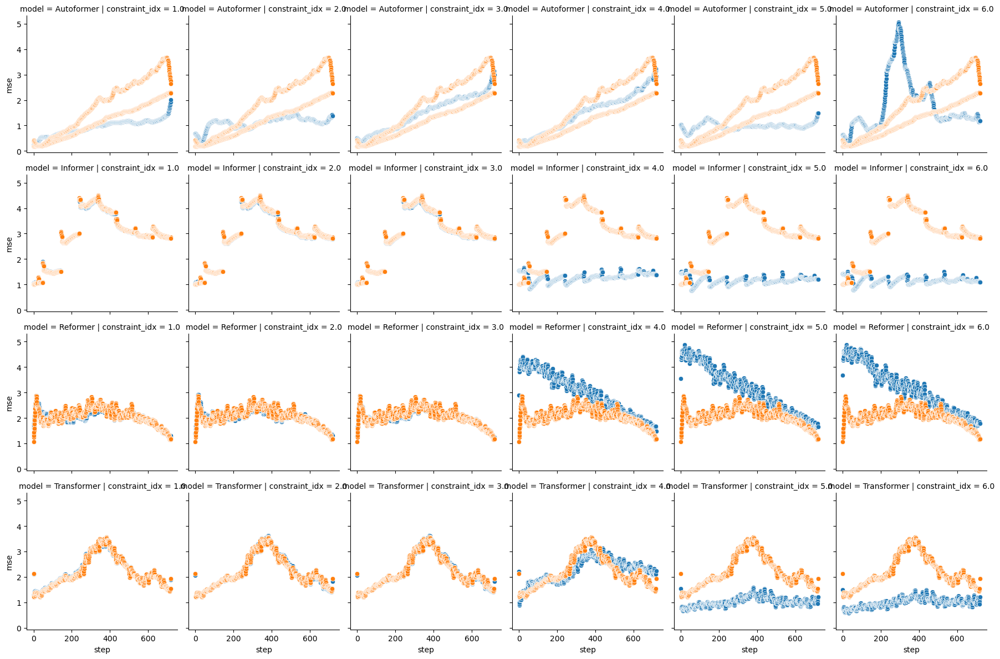

In [28]:
data_path="exchange_rate.csv"
df_this_plot = df_to_plot_nogs.query('pred_len==720 and data_path==@data_path and split=="test" and constraint_idx > 0')#.constraint_level.unique()
df_this_plot = df_this_plot[(df_this_plot.constraint_type.isin(['erm','constant'])) & (df_this_plot.model.isin(["Autoformer","Reformer","Transformer","Informer"]))]
df_this_plot = df_this_plot.sort_values(['model','data_path','constraint_type'])

grid = sns.FacetGrid(df_this_plot,row='model',col='constraint_idx',hue='constraint_type')
grid.map(sns.scatterplot,'step','mse')
# Pivot with col being constraint_idx and row being data path and model, with values being mse

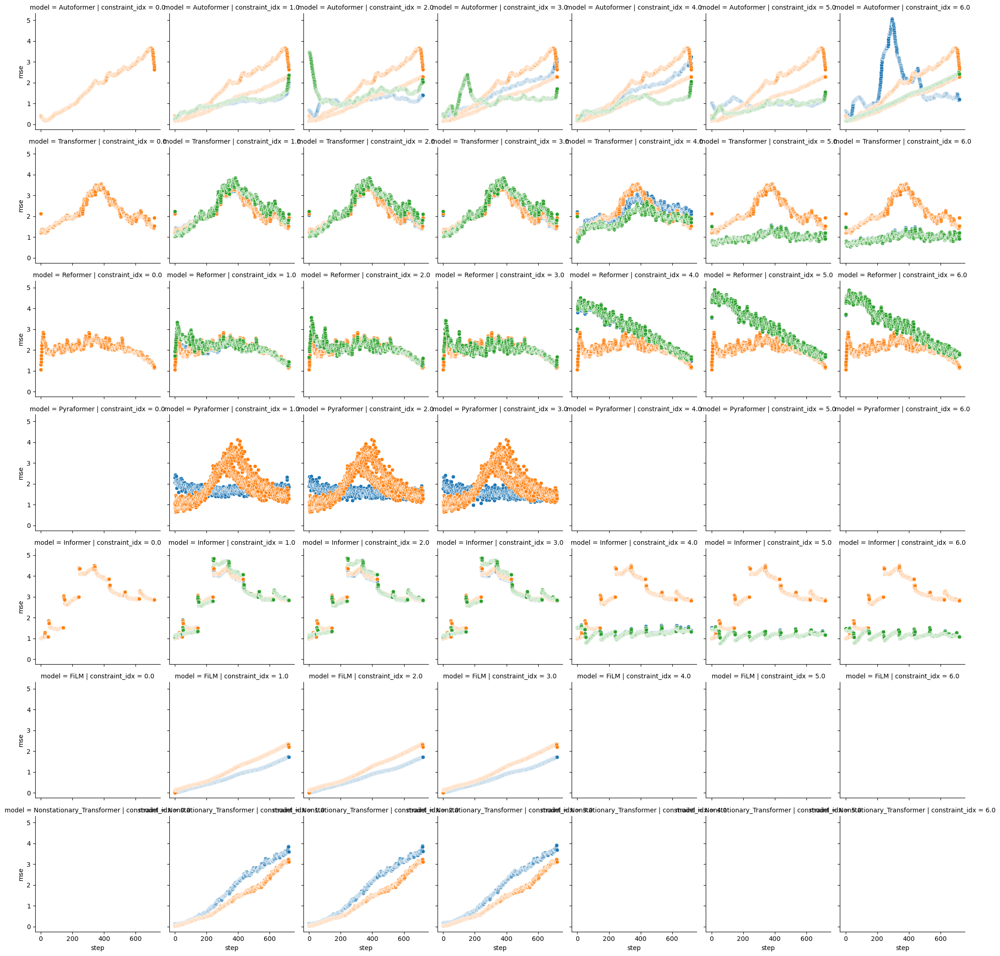

In [30]:
data_path="exchange_rate.csv"
df_this_plot = df_to_plot_nogs.query('pred_len==720 and data_path==@data_path and split=="test"')#.constraint_level.unique()

grid = sns.FacetGrid(df_this_plot,row='model',col='constraint_idx',hue='constraint_type')
grid.map(sns.scatterplot,'step','mse')
# Pivot with col being constraint_idx and row being data path and model, with values being mse
#df_this_plot.pivot(on=)


## Plots

### PAPER: ERM vs. Constrained on 50th percentile on all datasets (one seed)
nonresilience

In [31]:
#deleteme
df_to_plot#.query("model==''")
df_to_plot.model.unique()
df_to_plot.query("model=='Nonstationary_Transformer'").constraint_type.unique()
df_to_plot.query("model=='FiLM'").constraint_type.unique()
#real_df_newmodels.query("model=='Nonstationary_Transformer'").constraint_type.unique()
#real_df_newmodels.query("model=='Nonstationary_Transformer'").constraint_type.unique()
#real_df_newmodels.query("model=='Pyraformer'").constraint_type.unique()

array(['constant', 'erm'], dtype=object)

Warning didnt find dataset ETTh1.csv
Warning didnt find dataset ETTh2.csv
Warning didnt find dataset ETTm1.csv
Warning didnt find dataset ETTm2.csv


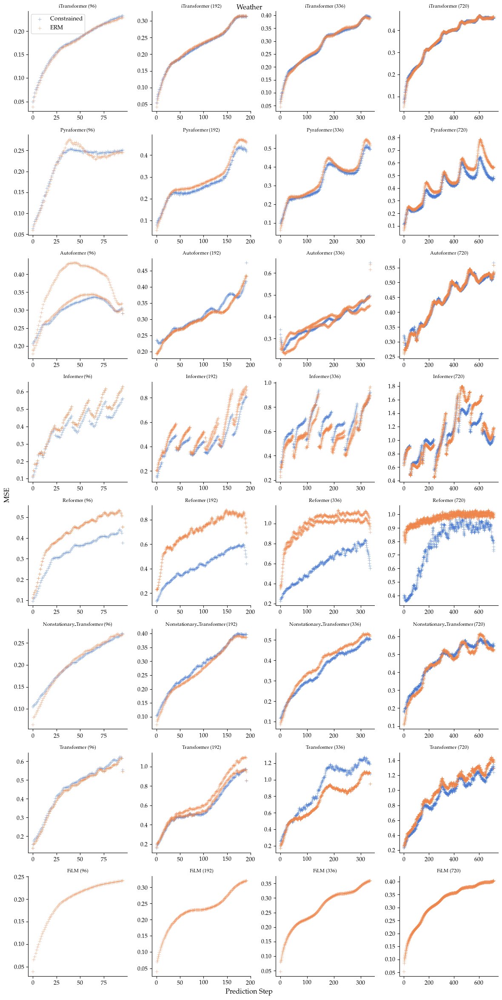

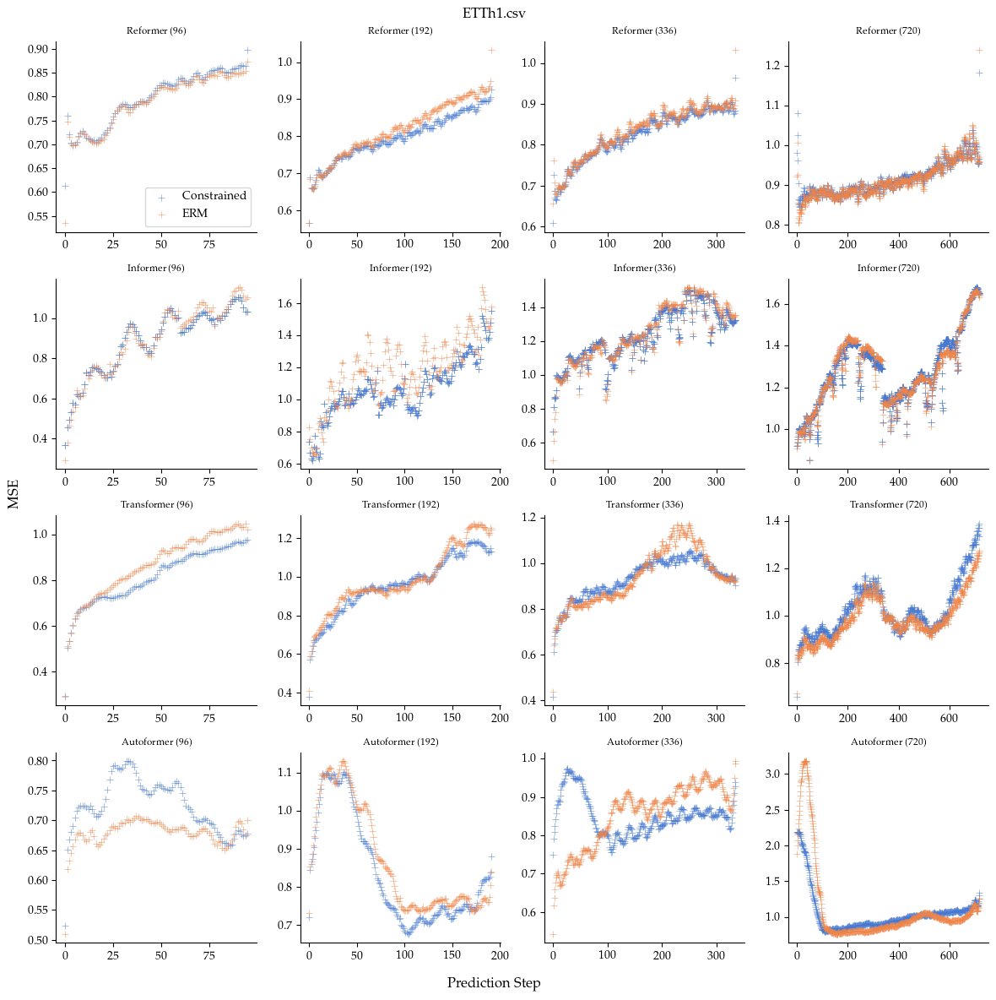

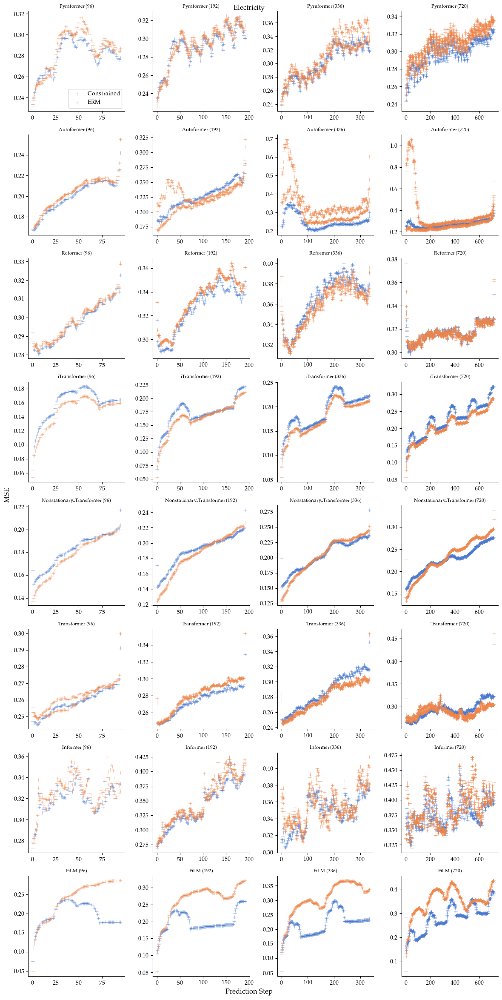

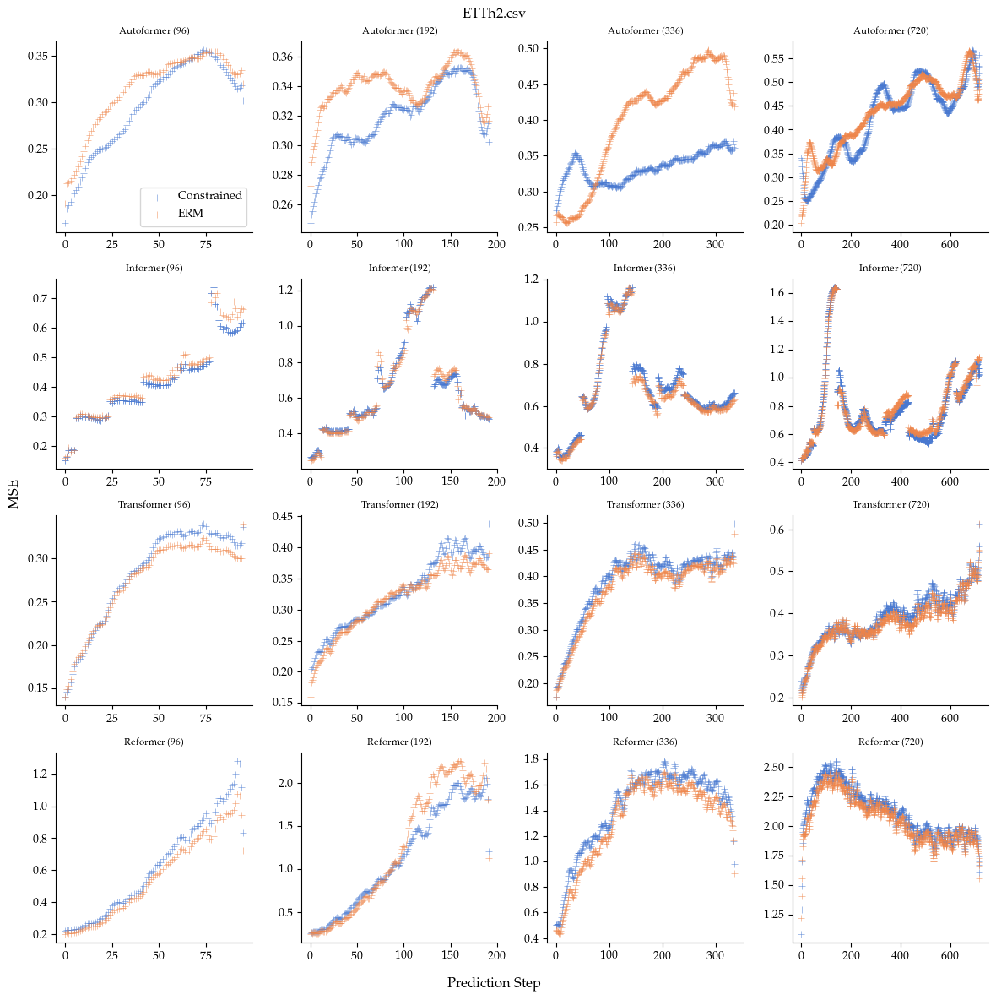

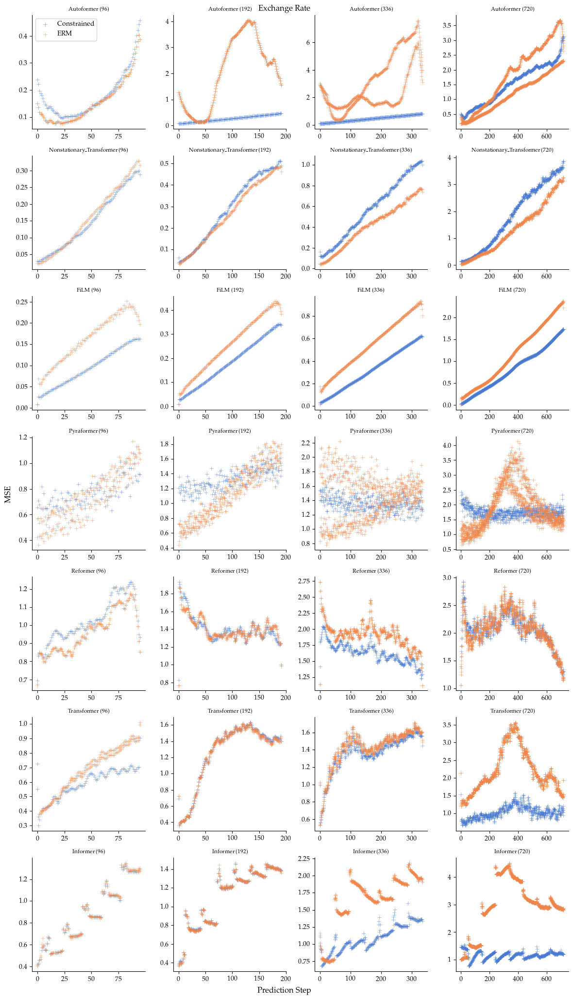

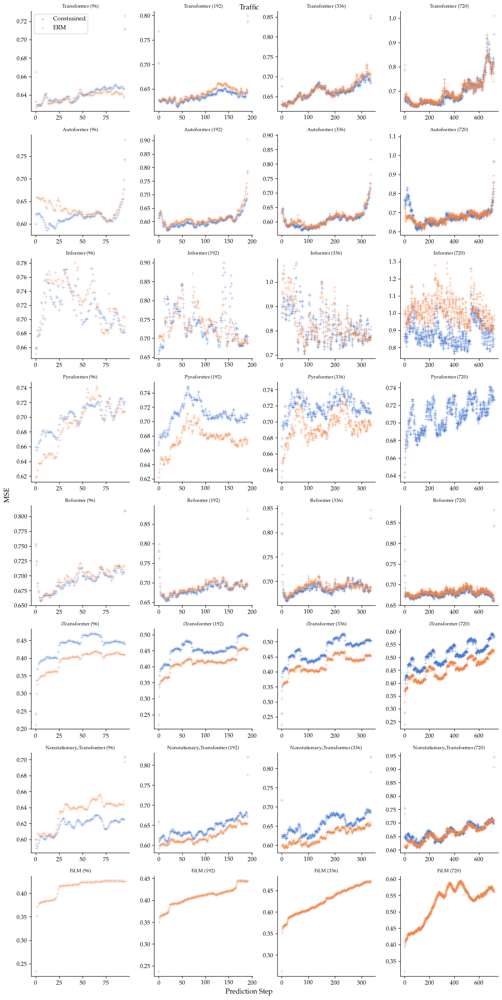

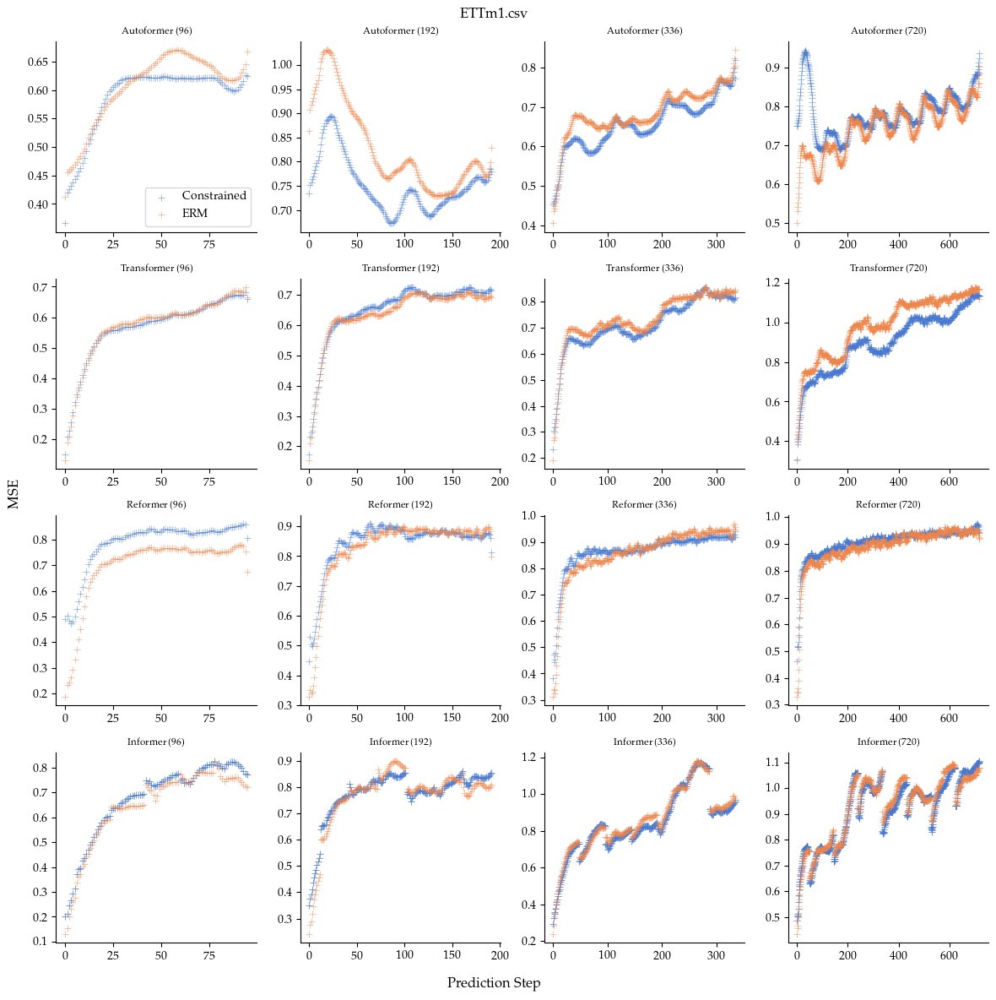

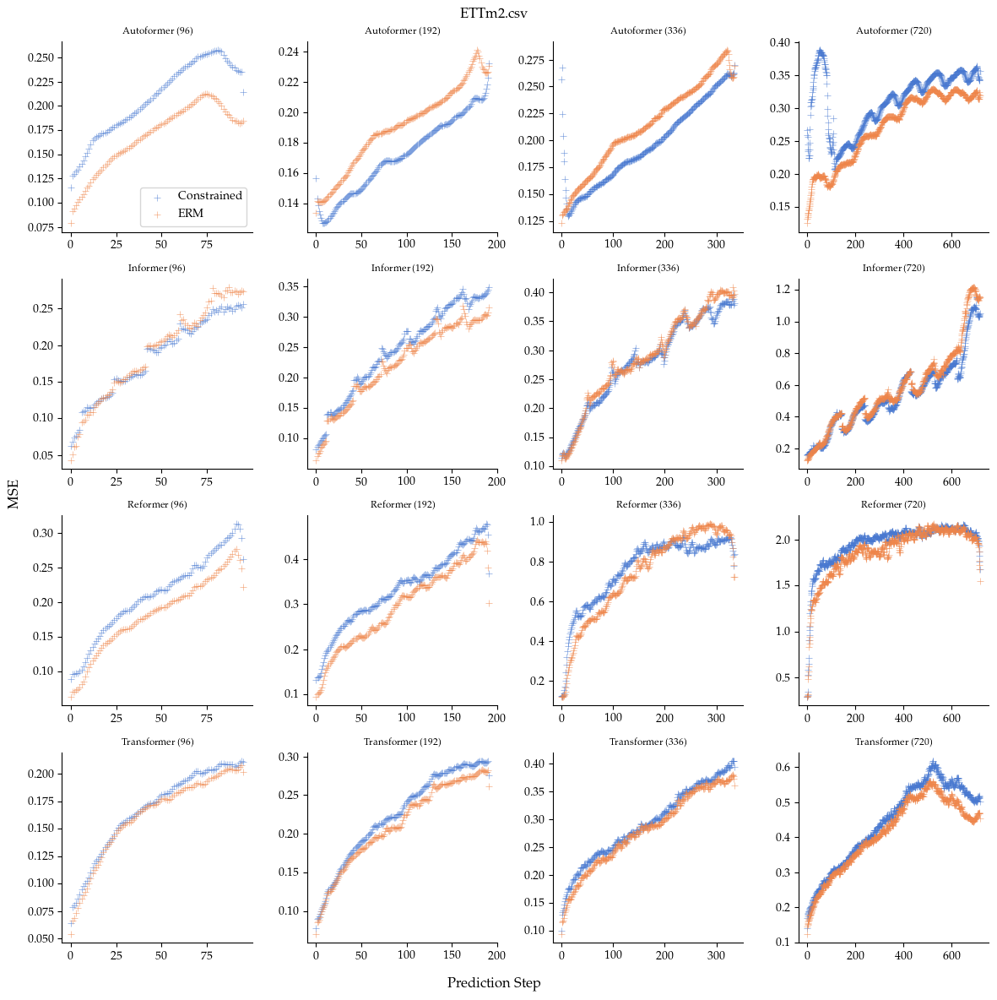

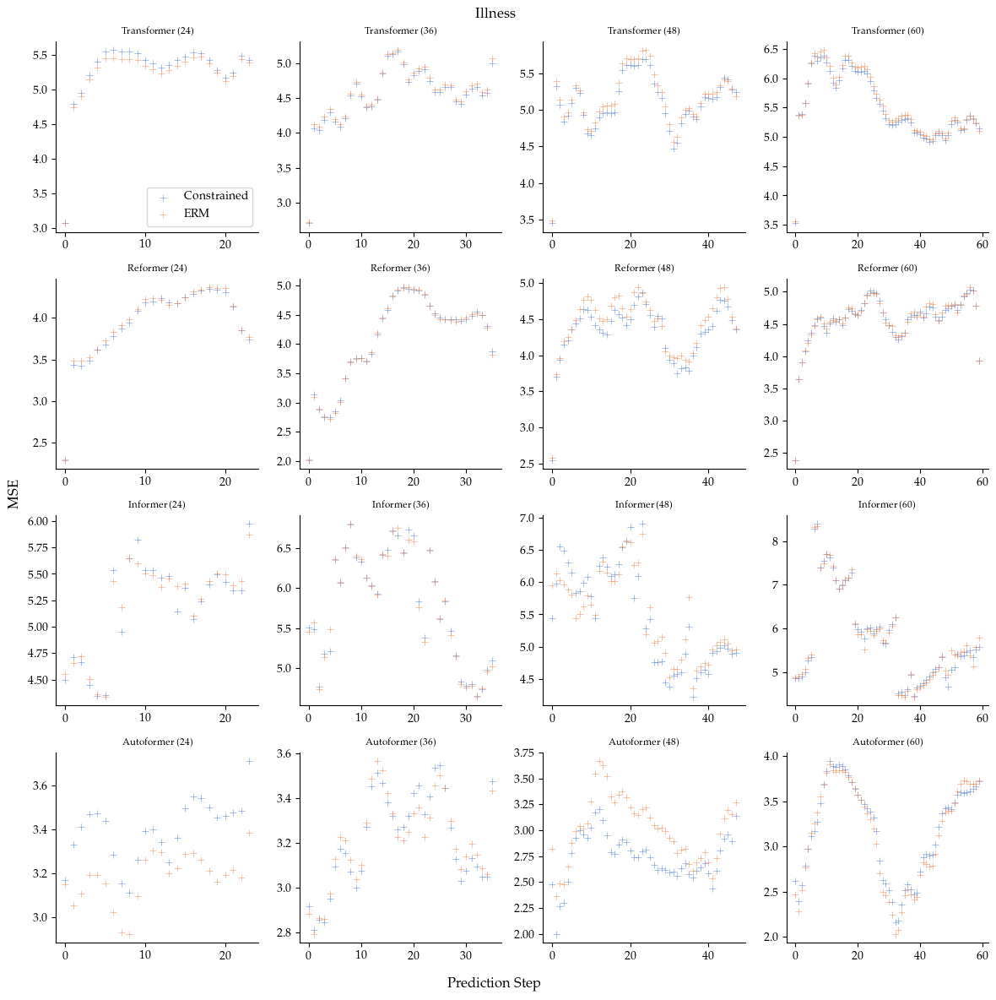

In [32]:
# PARAMS
split="test"
#constraint_idx = 1 # use the 50 percentile constraint to plot 1=25,2=50,3=75
seed=2021

sns.set_palette("muted")
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
})
mpl.rcParams['lines.linewidth'] = 1.8

# Filter
df_pct50_and_erm = df_to_plot[(df_to_plot.split==split) & (df_to_plot.constraint_type!='constant_resilience')].copy()

PRED_LENS=sorted(df_to_plot.pred_len.unique().tolist())
#PRED_LENS=[720]
#PRED_LENS=[96]

def pretty_name_dataset(data_path):
    if data_path=="electricity.csv": 
        return "Electricity"
    if data_path=="weather.csv":
        return "Weather"
    if data_path=="exchange_rate.csv":
        return "Exchange Rate"
    if data_path=="traffic.csv":
        return "Traffic"
    if data_path=="national_illness.csv":
        return "Illness"
    else: 
        print(f"Warning didnt find dataset {data_path}")
        return data_path

def sample_every_n(df,groupcols=['data_path','model','pred_len','split'],n=2):
    """
    Returns DF but only every nth row with respect to step within each group.
    """
    df_sampled = df.groupby(groupcols).apply(lambda x: x[(x.step//48)%n==0]).reset_index(drop=True)
    return df_sampled
    

#for pred_len in PRED_LENS:
for data_path in df_pct50_and_erm.data_path.unique():
    # Add data for constant line
    #df_current_plot = df_pct50_and_erm.query('pred_len==@pred_len').copy()
    df_current_plot = df_pct50_and_erm.query('data_path==@data_path').copy()
    df_current_plot['constraint_type'].replace({'erm':'ERM','constant':'Constrained'},inplace=True)
    #constraint_level = df_current_plot.constraint_level.unique()[0]
    #df_current_plot['constraint_level'] = constraint_level
    #display(Markdown(f"#### **ERM Vs Constrained {pred_len} (split={split})**"))
    #debug line:
    #df_current_plot.query("model=='FiLM' and constraint_type=='Constrained' and data_path=="weather.csv"").shape

    g = sns.FacetGrid(
                    #sample_every_n(df_current_plot),
                    df_current_plot,
                    #df_current_plot,
                    row='model', 
                    col='pred_len', 
                    hue='constraint_type', 
                    height=3, 
                    aspect=1.0, 
                    legend_out=False,
                    #legend='full',
                    sharex=False,
                    sharey=False,
                    )
    #g.set_titles(row_template="", col_template="")
    
    #g.map(sns.lineplot, "step", "constraint_level", alpha=.7)
    g.map(sns.scatterplot, "step", "mse",marker='+',alpha=0.7,legend='full',edgecolor=None)
    g.add_legend()
    
    g.set_xlabels("")
    g.set_ylabels("")
    g.set_titles(template="{row_name} ({col_name})")
    g.fig.supxlabel("Prediction Step")
    g.fig.supylabel("MSE")
    g.fig.suptitle(f'{pretty_name_dataset(data_path)}')
    for ax in g.axes.flat:
        ax.set_title(ax.get_title(), fontsize='small')
        ax.set_xlabel(ax.get_xlabel(), fontsize='large')
        ax.set_ylabel(ax.get_ylabel(), fontsize='large')

    # make markers bigger
    for ax in g.axes.flat:
        for p in ax.patches:
            p.set( markersize=20)
    # disable legend
    #g._legend.remove()
    g._legend.set_title("")
    # legend fontsizesmall
    #g._legend.texts
    #g._legend.set_frame_on(False)
    # tight layout
    g.fig.tight_layout()
    
    #TODO fix and uncomment
    name_without_extension = data_path.split(".")[0]
    g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_all_{name_without_extension}.pdf")
    #plt.show()

### ERM Vs Constrained parameterized on split (NO GS)
Using non gridsearch data to explore the results

Warning didnt find dataset ETTh2.csv
Warning didnt find dataset ETTm2.csv
Warning didnt find dataset ETTm1.csv
Warning didnt find dataset ETTh1.csv


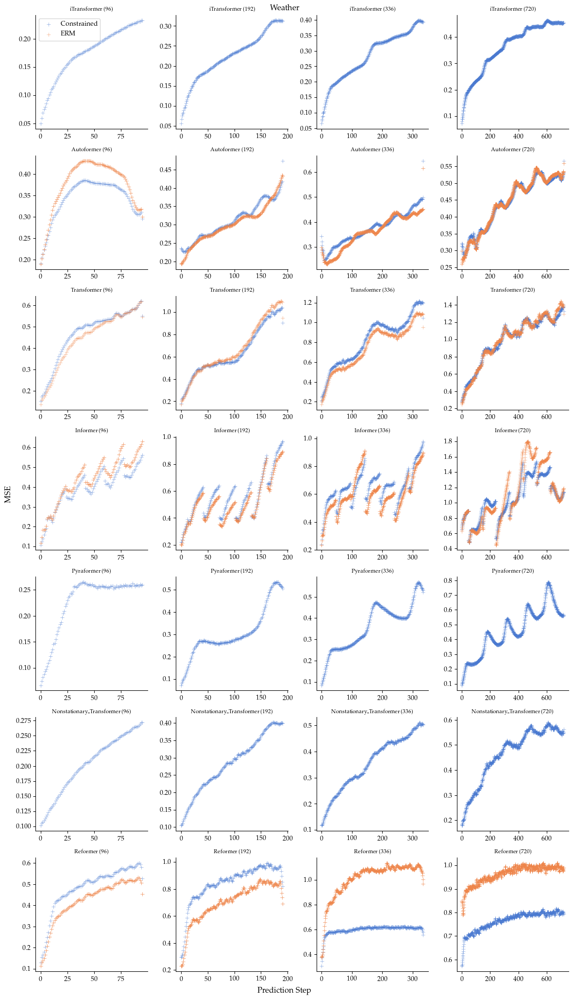

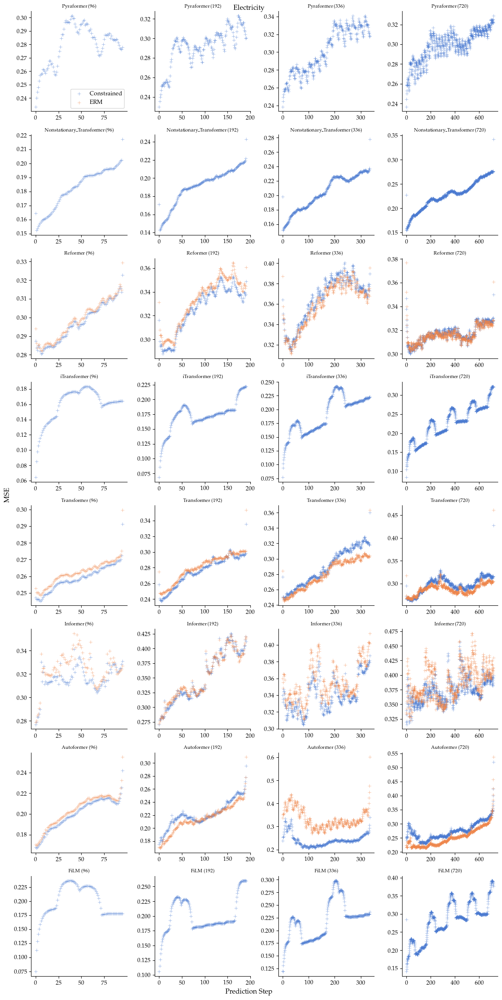

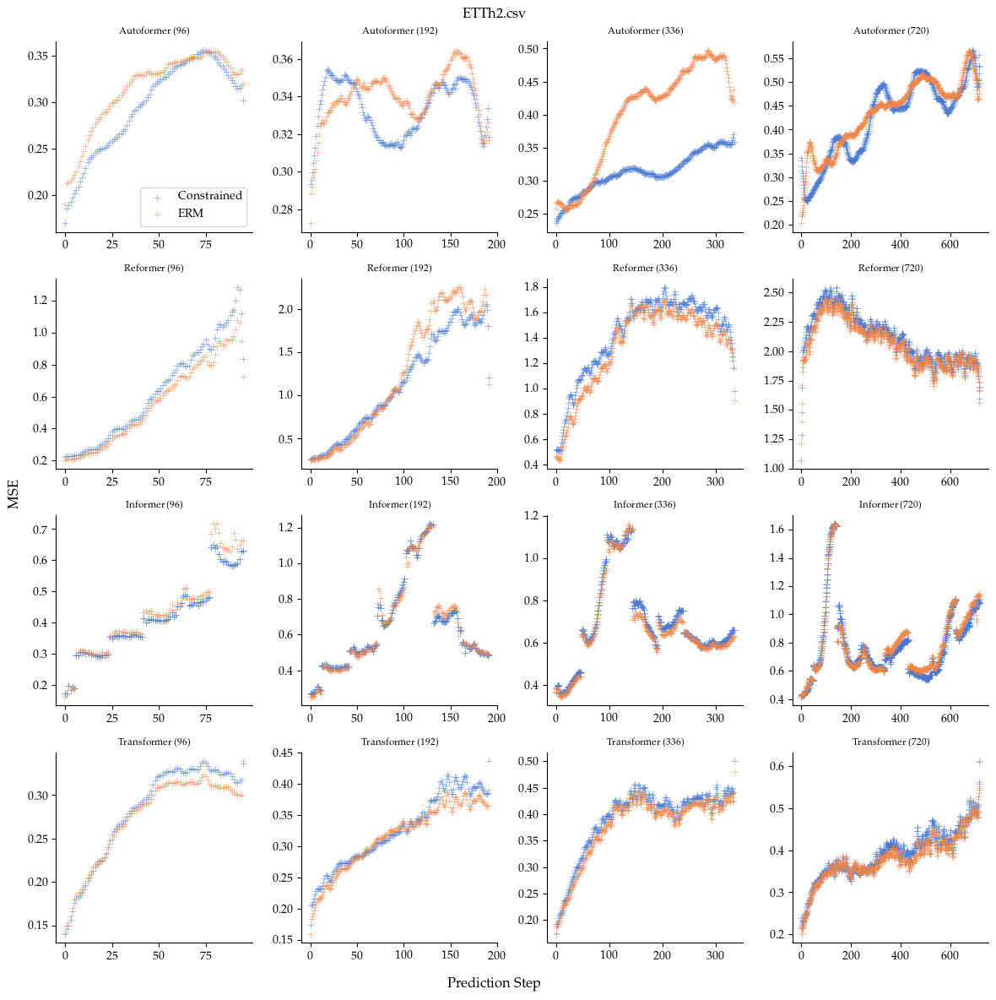

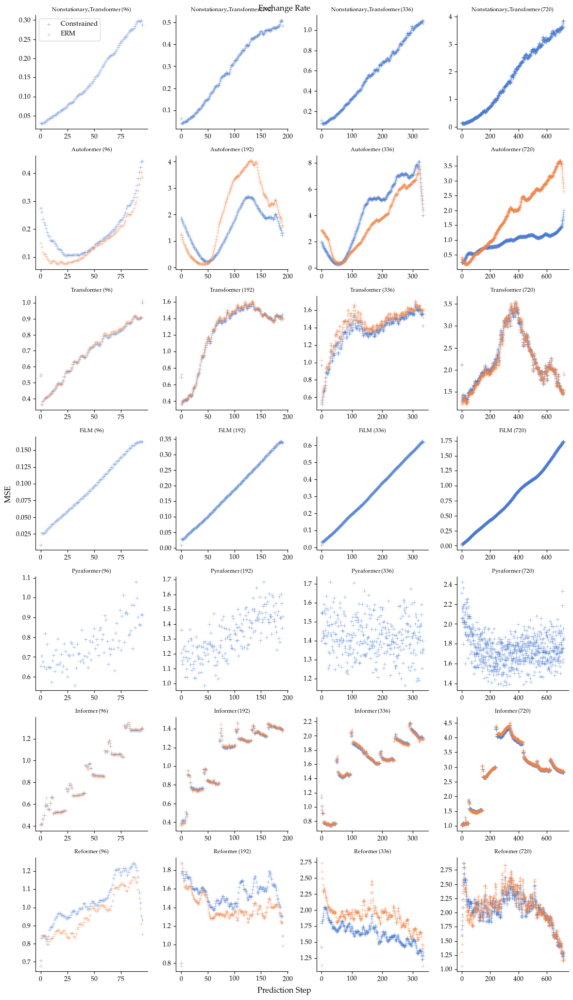

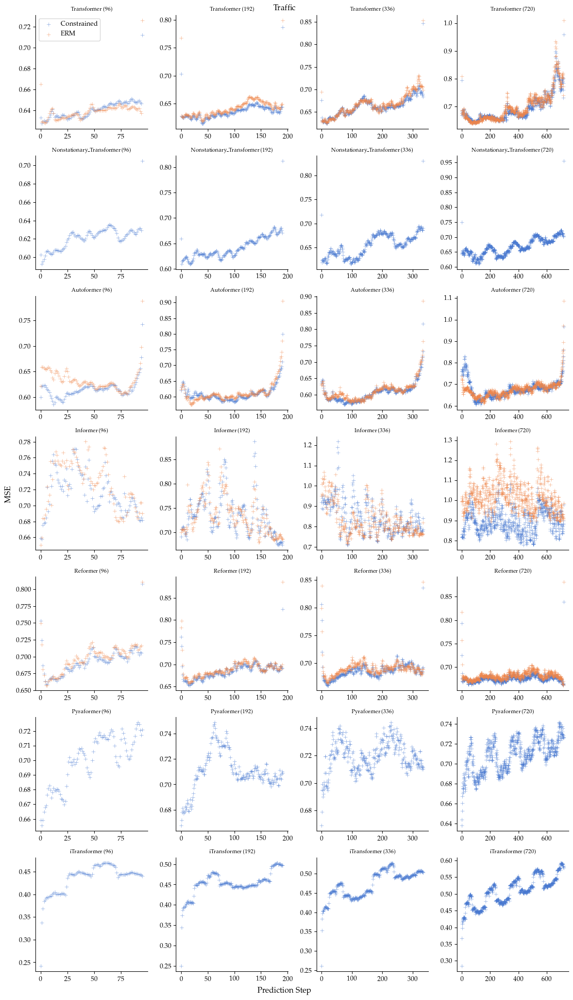

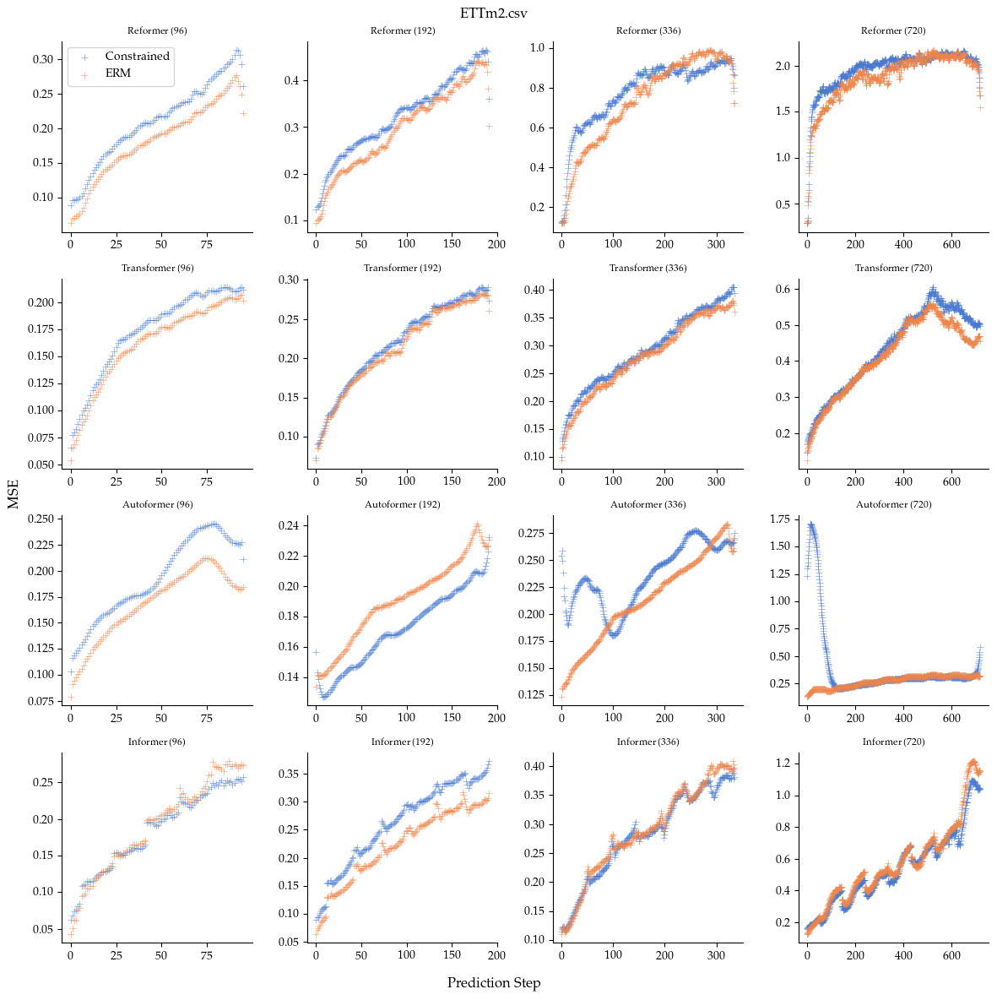

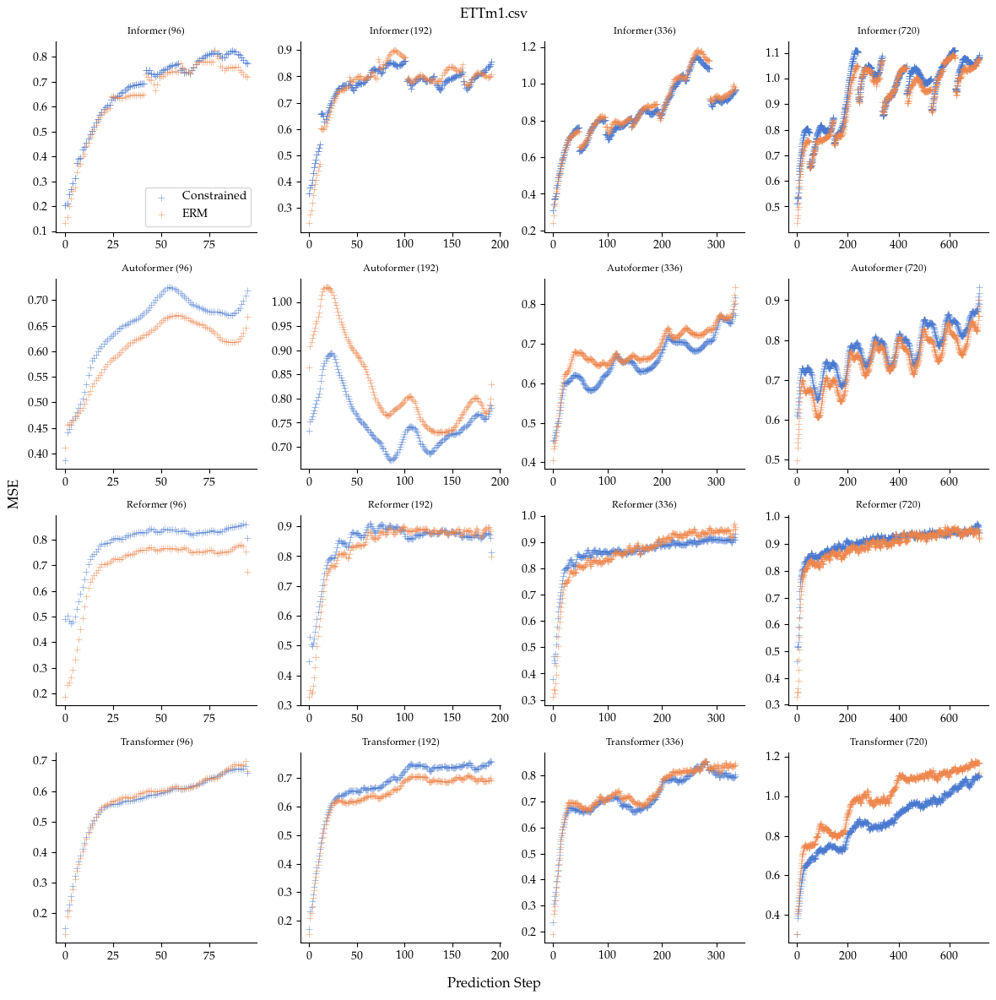

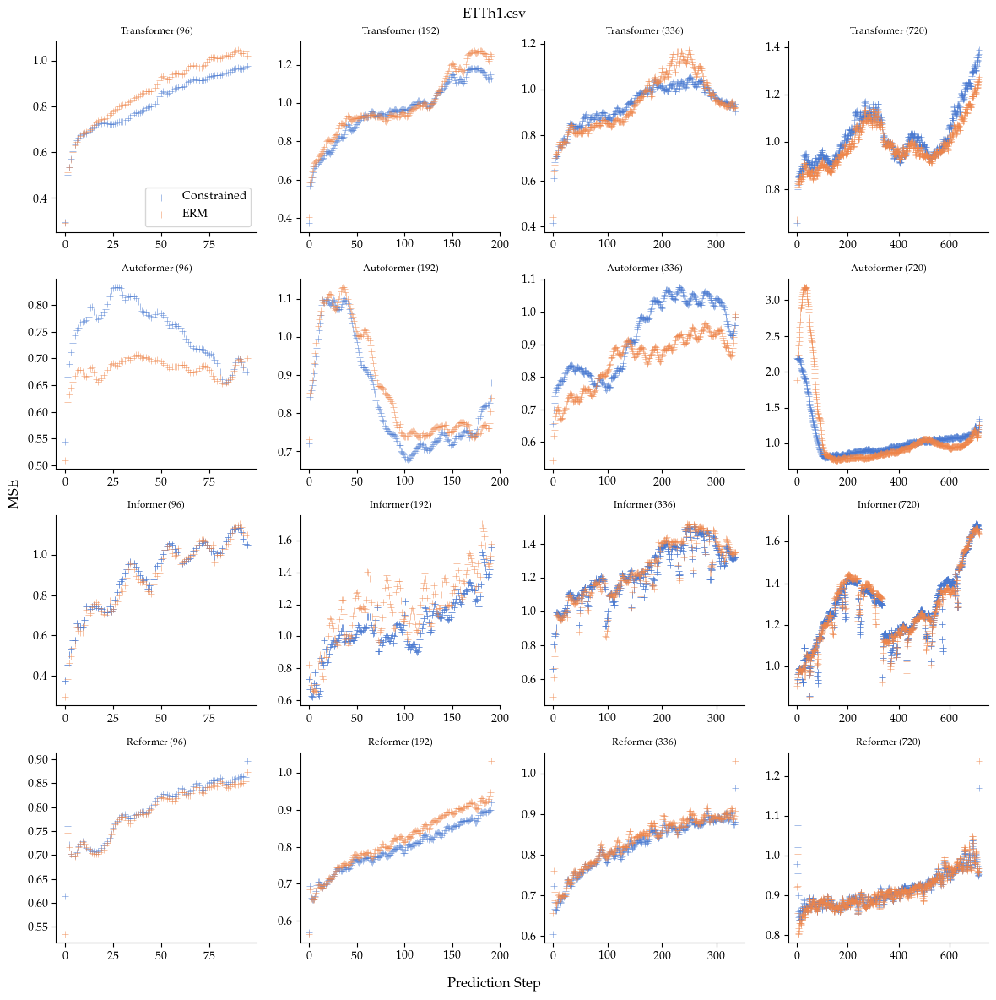

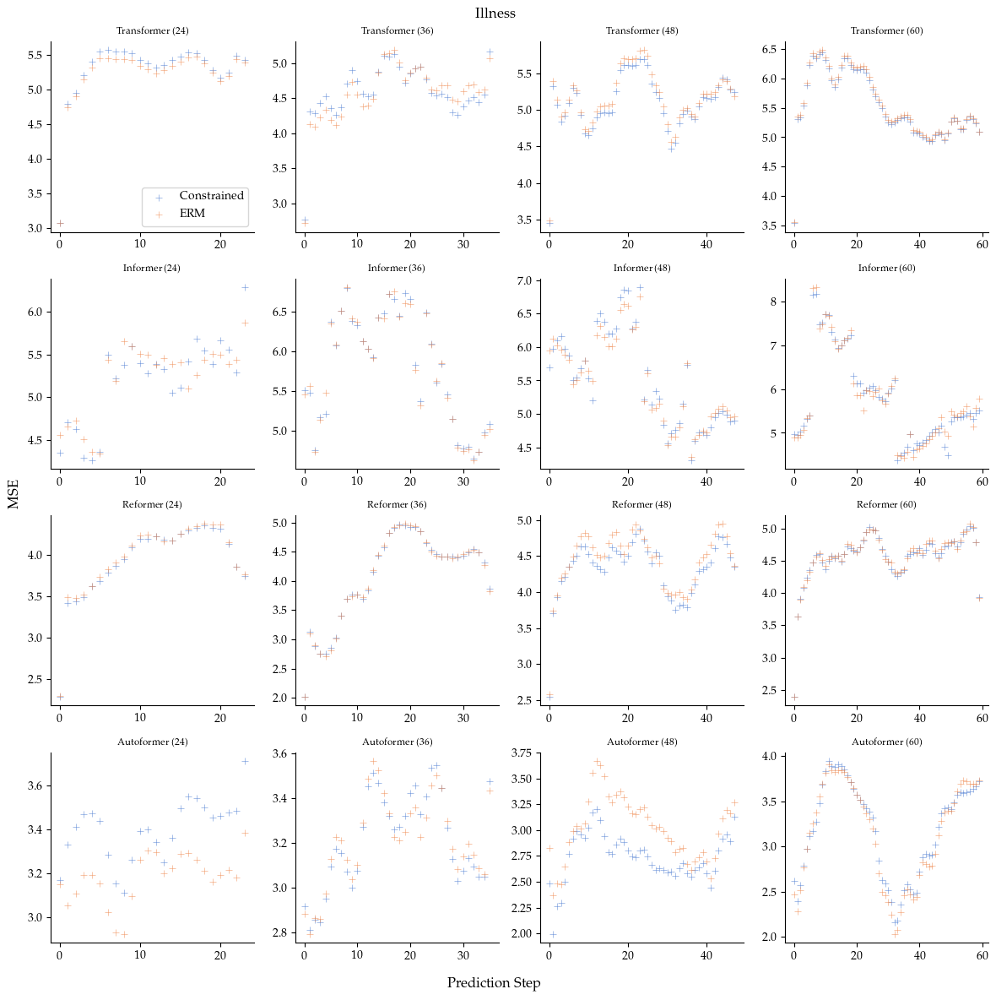

In [35]:
# PARAMS
split="test"
constraint_idx = 1 # use 25% to see the highest multipliers to plot 1=25,2=50,3=75
seed=2021

sns.set_palette("muted")
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
})
mpl.rcParams['lines.linewidth'] = 1.8

# Filter
df_pct50_and_erm = df_to_plot_nogs[(df_to_plot_nogs.seed==seed) & 
                                   (df_to_plot_nogs.split==split) & 
                                   (df_to_plot_nogs.constraint_type!='constant_resilience') & 
                                   (df_to_plot_nogs.constraint_idx==constraint_idx)].copy()

PRED_LENS=sorted(df_to_plot_nogs.pred_len.unique().tolist())
#PRED_LENS=[720]
#PRED_LENS=[96]

def pretty_name_dataset(data_path):
    if data_path=="electricity.csv": 
        return "Electricity"
    if data_path=="weather.csv":
        return "Weather"
    if data_path=="exchange_rate.csv":
        return "Exchange Rate"
    if data_path=="traffic.csv":
        return "Traffic"
    if data_path=="national_illness.csv":
        return "Illness"
    else: 
        print(f"Warning didnt find dataset {data_path}")
        return data_path

def sample_every_n(df,groupcols=['data_path','model','pred_len','split'],n=2):
    """
    Returns DF but only every nth row with respect to step within each group.
    """
    df_sampled = df.groupby(groupcols).apply(lambda x: x[(x.step//48)%n==0]).reset_index(drop=True)
    return df_sampled
    

#for pred_len in PRED_LENS:
for data_path in df_pct50_and_erm.data_path.unique():
    # Add data for constant line
    #df_current_plot = df_pct50_and_erm.query('pred_len==@pred_len').copy()
    df_current_plot = df_pct50_and_erm.query('data_path==@data_path').copy()
    df_current_plot['constraint_type'].replace({'erm':'ERM','constant':'Constrained'},inplace=True)
    #constraint_level = df_current_plot.constraint_level.unique()[0]
    #df_current_plot['constraint_level'] = constraint_level
    #display(Markdown(f"#### **ERM Vs Constrained {pred_len} (split={split})**"))

    g = sns.FacetGrid(
                    #sample_every_n(df_current_plot),
                    df_current_plot,
                    #df_current_plot,
                    row='model', 
                    col='pred_len', 
                    hue='constraint_type', 
                    height=3, 
                    aspect=1.0, 
                    legend_out=False,
                    #legend='full',
                    sharex=False,
                    sharey=False,
                    )
    #g.set_titles(row_template="", col_template="")
    
    #g.map(sns.lineplot, "step", "constraint_level", alpha=.7)
    g.map(sns.scatterplot, "step", "mse",marker='+',alpha=0.7,legend='full',edgecolor=None)
    g.add_legend()
    
    g.set_xlabels("")
    g.set_ylabels("")
    g.set_titles(template="{row_name} ({col_name})")
    g.fig.supxlabel("Prediction Step")
    g.fig.supylabel("MSE")
    g.fig.suptitle(f'{pretty_name_dataset(data_path)}')
    for ax in g.axes.flat:
        ax.set_title(ax.get_title(), fontsize='small')
        ax.set_xlabel(ax.get_xlabel(), fontsize='large')
        ax.set_ylabel(ax.get_ylabel(), fontsize='large')

    # make markers bigger
    for ax in g.axes.flat:
        for p in ax.patches:
            p.set( markersize=20)
    # disable legend
    #g._legend.remove()
    g._legend.set_title("")
    # legend fontsizesmall
    #g._legend.texts
    #g._legend.set_frame_on(False)
    # tight layout
    g.fig.tight_layout()
    
    #TODO fix and uncomment
    name_without_extension = data_path.split(".")[0]
    g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_all_nogs_{name_without_extension}.pdf")
    #plt.show()

### Train vs test

In [37]:
# PARAMS
#split="test"
#constraint_idx = 1 # use the 50 percentile constraint to plot 1=25,2=50,3=75
seed=2021

# Filter
df_pct50_and_erm = df_to_plot[(df_to_plot.seed==seed) & (df_to_plot.split.isin(['train','test'])) & (df_to_plot.constraint_type.isin(['erm',CONSTRAINT_TYPE]))].copy()

PRED_LENS=sorted(df_to_plot.pred_len.unique().tolist())
#PRED_LENS=[720]
#PRED_LENS=[96]
#for model in df_to_plot.model.unique():
for data_path in df_to_plot.data_path.unique():
    for pred_len in PRED_LENS:
        # Add data for constant line
        df_current_plot = df_pct50_and_erm.query('pred_len==@pred_len and data_path==@data_path').copy()
        mses=df_current_plot.groupby(['model','split','constraint_type'])['mse'].mean().reset_index()
        # plot only if train constant is lower than train erm and test constant is higher than test erm
        # if mses.query('split=="train"').query('constraint_type=="constant"').mse.values[0] < mses.query('split=="train"').query('constraint_type=="erm"').mse.values[0] and \
        #     mses.query('split=="test"').query('constraint_type=="constant"').mse.values[0] > mses.query('split=="test"').query('constraint_type=="erm"').mse.values[0]:
        display(Markdown(f"#### **ERM Vs Constrained {data_path}--{pred_len}**"))
    
        #constraint_level = df_current_plot.constraint_level.unique()[0]
        #df_current_plot['constraint_level'] = constraint_level
        display(Markdown(f"#### **ERM Vs Constrained {data_path}--{pred_len}**"))

        g = sns.FacetGrid(df_current_plot, col='model', row='split', hue='constraint_type', height=3, aspect=1.5, legend_out=True,sharex=False,sharey=False)
        #g.map(sns.lineplot, "step", "constraint_level", alpha=.7)
        g.map(sns.scatterplot, "step", "mse", alpha=.7)
        g.map(sns.lineplot, "step", "constraint_level", alpha=.7)
        g.add_legend()
        #TODO fix and uncomment
        #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_{pred_len}_{str(constraint_level).replace('.','')}.png")
        plt.show()

#### **ERM Vs Constrained weather.csv--24**

#### **ERM Vs Constrained weather.csv--24**

ValueError: Number of rows must be a positive integer, not 0

<Figure size 0x0 with 0 Axes>

#### Train vs test select example!!!

(636, 129)
success


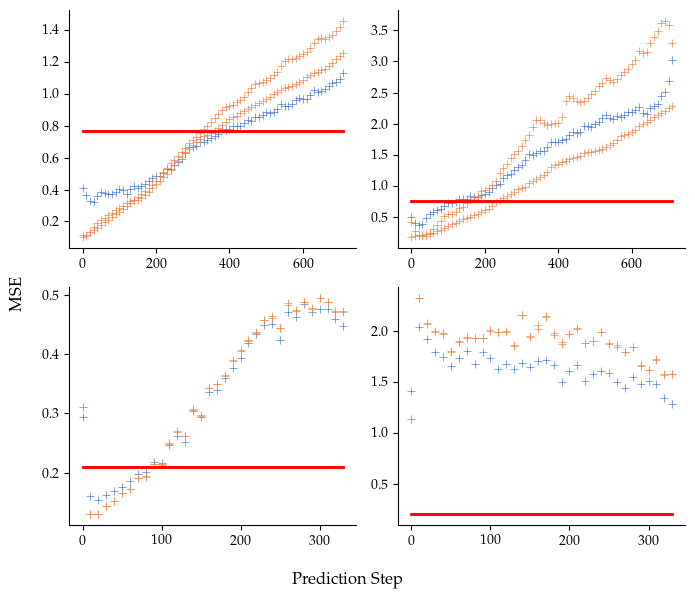

(3168, 129)
failures


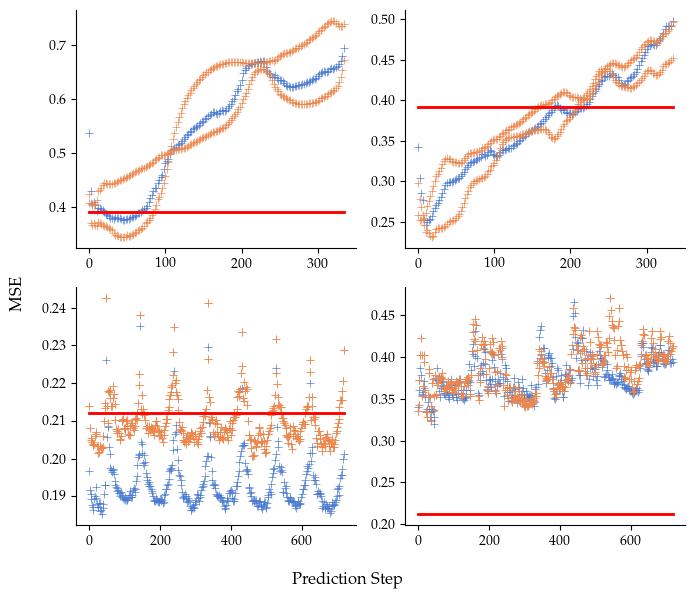

In [38]:
import matplotlib as mpl
# Get the two success cases and two failures cases in separate dfs
# constant and erm
#**ECL192 transformer**
#**Weather 192 REformer
#Drop this one in favor of a more textbook one
#success1 = df_to_plot.query('data_path=="electricity.csv" and pred_len==192 and split!="val" and model=="Transformer" and (constraint_type=="constant" or constraint_type=="erm")').copy()
success1 = df_to_plot.query('data_path=="exchange_rate.csv" and pred_len==720 and split!="val" and model=="Autoformer" and (constraint_type=="constant" or constraint_type=="erm")').copy()
success2 = df_to_plot.query('data_path=="exchange_rate.csv" and pred_len==336 and split!="val" and model=="Reformer" and (constraint_type=="constant" or constraint_type=="erm")').copy()
#**Weather 332 Autoformer**
#**Electricity 720 Informer**
failure1 = df_to_plot.query('data_path=="weather.csv" and pred_len==336 and split!="val" and model=="Autoformer" and (constraint_type=="constant" or constraint_type=="erm")').copy()
failure2 = df_to_plot.query('data_path=="electricity.csv" and pred_len==720 and split!="val" and model=="Informer" and (constraint_type=="constant" or constraint_type=="erm")').copy()


sns.set_palette("muted")
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
})
mpl.rcParams['lines.linewidth'] = 1.8

# add only one x axis label
g.set_xlabels("")
g.set_ylabels("")
# set axis label at the figure level
# add the hline
# for ax in g.axes:
#     ax.axhline(y=constraint_level, color='r', linestyle='-')
g.fig.supxlabel("Prediction Step")
g.fig.supylabel("MSE")


#TODO
g.set_titles(col_template="{col_name}")


# evens = df_set1["step"]%10
# df_set1 = df_set1[evens==0]
# evens = df_set2["step"]%2
# df_set2 = df_set2[evens==0]

    
# Plot all cases
success = pd.concat([success1,success2])
failures = pd.concat([failure1,failure2])
for plot_data,figname in [
    # (success1,"success_electricity_transformer_192"),
    # (success2,"success_weather_reformer_192"),
    # (failure1,"failure_weather_autoformer_332"),
    # (failure2,"failure_electricity_informer_720")
    (success,"success"),
    (failures,"failures")
    ]:
    # print(failure1.shape)
    # print(failure2.shape)
    if plot_data.pred_len.iloc[0]>500:
        evens = plot_data["step"]%10
        plot_data = plot_data[evens==0]
    # elif plot_data.pred_len.iloc[0]==336:
    #     evens = plot_data["step"]%4
    #     plot_data = plot_data[evens==0]
    else: 
        evens = plot_data["step"]%2
        plot_data = plot_data[evens==0]
    print(plot_data.shape)
    print(figname)
    g = sns.FacetGrid(plot_data, row="model",col='split', hue='constraint_type', height=3, aspect=1.0, legend_out=True,sharex=False,sharey=False)
    g.map(sns.scatterplot, "step", "mse", legend='full', marker='+')
    g.map(sns.lineplot, "step", "constraint_level", legend='full',color='red')
    
    g.add_legend()
    
    g.set_xlabels("")
    g.set_ylabels("")
    g.set_titles(col_template="{col_name}")
    g.fig.supxlabel("Prediction Step")
    g.fig.supylabel("MSE")
    for ax in g.axes.flat:
        ax.set_title("", fontsize='large')
        ax.set_xlabel(ax.get_xlabel(), fontsize='large')
        ax.set_ylabel(ax.get_ylabel(), fontsize='large')

    # make markers bigger
    for ax in g.axes.flat:
        for p in ax.patches:
            p.set( markersize=20)
    # disable legend
    g._legend.remove()
    # tight layout
    g.fig.tight_layout()
    g.savefig(f"../figures/icml/{figname}.pdf")
    plt.show()

# g = sns.FacetGrid(df_current_plot, col='model', row='split', hue='constraint_type', height=3, aspect=1.5, legend_out=True,sharex=False,sharey=False)
# #g.map(sns.lineplot, "step", "constraint_level", alpha=.7)
# g.map(sns.scatterplot, "step", "mse", alpha=.7)
# g.add_legend()
# #TODO fix and uncomment
# #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_{pred_len}_{str(constraint_level).replace('.','')}.png")
# plt.show()

### REVIEWER REQUEST: Multipliers over the window

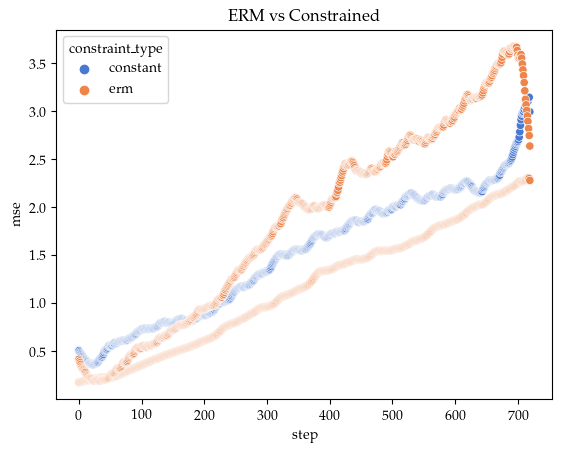

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


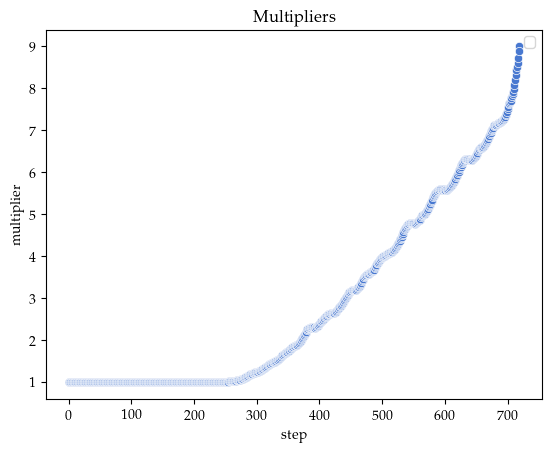

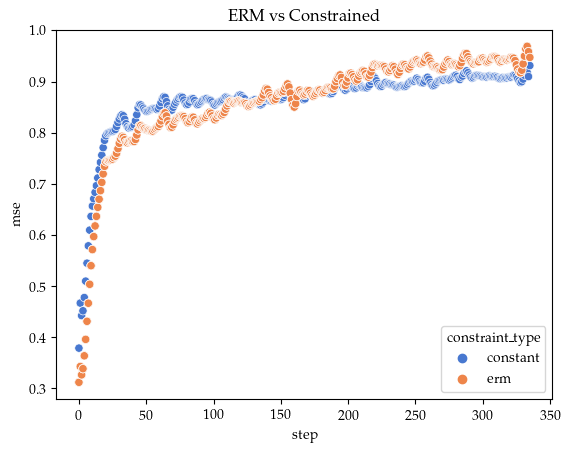

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


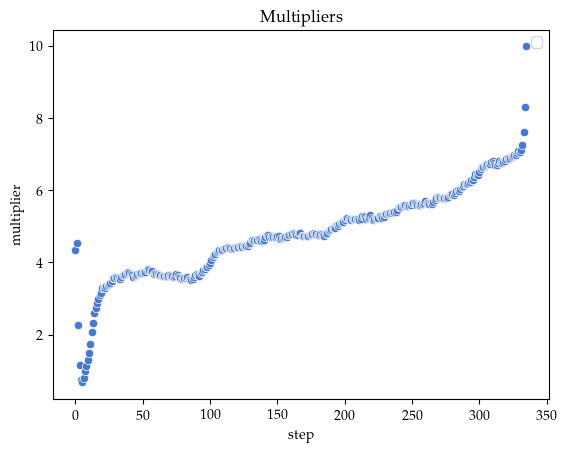

In [39]:
# PARAMS

# Filter
# example_one = df_to_plot[
#     (df_to_plot.constraint_idx.isin([0,constraint_idx])) 
#     & (df_to_plot.split==split)
#     & (df_to_plot.constraint_type=="constant")
#     & (df_to_plot.model=="Autoformer")
#     & (df_to_plot.pred_len==720)
#     ].copy()

example_one = df_to_plot.query('(constraint_type=="constant" or constraint_type=="erm") and data_path=="exchange_rate.csv" and model=="Autoformer" and pred_len==720')
#example_two = df_to_plot_nogs.query('((constraint_type=="constant" and constraint_idx==1) or constraint_type=="erm") and data_path=="weather.csv" and model=="Autoformer" and pred_len==96')
example_two = df_to_plot_nogs.query('((constraint_type=="constant" and constraint_idx==1) or constraint_type=="erm") and data_path=="ETTm1.csv" and model=="Reformer" and pred_len==336')
#display(example_one)
for data in [example_one,example_two]:
#for data in [example_two]:
    g1 = sns.scatterplot(data=data.query('split=="test"'),x="step", y="mse",hue='constraint_type')#, alpha=.7,color='red',label='Multiplier')
    g1.set_title("ERM vs Constrained")
    plt.show()
    g2 = sns.scatterplot(data=data.query("constraint_type=='constant'"),x="step", y="multiplier")#, alpha=.7,color='red',label='Multiplier')
    g2.legend()
    g2.set_title("Multipliers")
    plt.show()


In [ ]:
# PRED_LENS=sorted(df_to_plot.pred_len.unique().tolist())
# #PRED_LENS=[96]
# for pred_len in PRED_LENS:
#     # Add data for constant line
#     df_current_plot = df_pct50.query('pred_len==@pred_len').copy()
#     #constraint_level = df_current_plot.constraint_level.unique()[0]
#     #df_current_plot['constraint_level'] = constraint_level
#     display(Markdown(f"#### **Multipliers vs loss {pred_len} (split={split}, constraint_idx={constraint_idx})**"))

#     g = sns.FacetGrid(df_current_plot, col='model', row='data_path', height=3, aspect=1.5, legend_out=True)
#     # Plot multipliers and MSEs
#     g.map(sns.scatterplot, "step", "mse", alpha=.7,color='blue',label='MSE')
#     g.map(sns.scatterplot, "step", "multiplier", alpha=.7,color='red',label='Multiplier')
#     # Add legend the series

#     g.add_legend()
#     #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_{pred_len}_{str(constraint_level).replace('.','')}.png")
#     plt.show()

### ALL Multipliers

#### **Multipliers vs loss 24 (split=train, constraint_idx=1)**

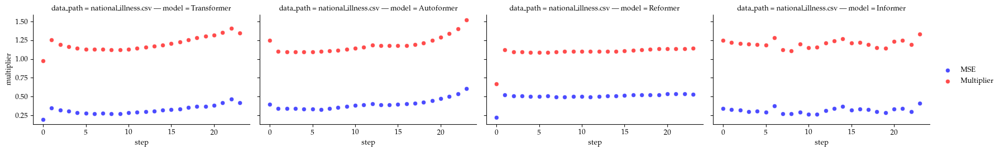

#### **Multipliers vs loss 36 (split=train, constraint_idx=1)**

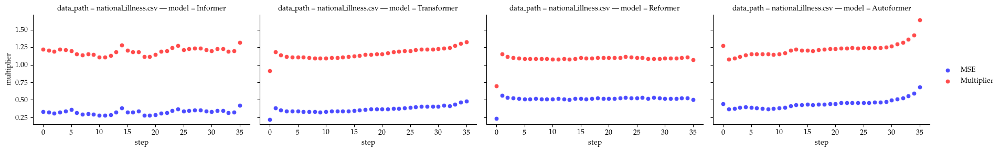

#### **Multipliers vs loss 48 (split=train, constraint_idx=1)**

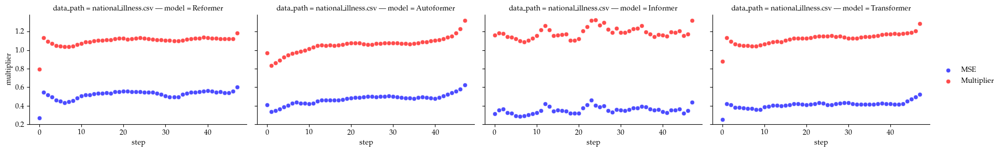

#### **Multipliers vs loss 60 (split=train, constraint_idx=1)**

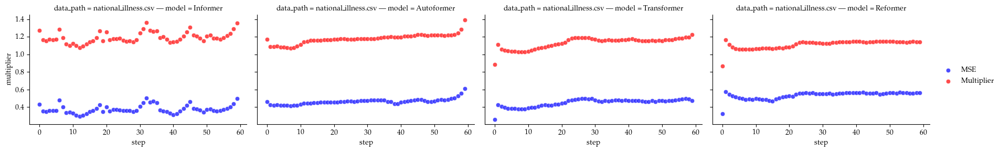

#### **Multipliers vs loss 96 (split=train, constraint_idx=1)**

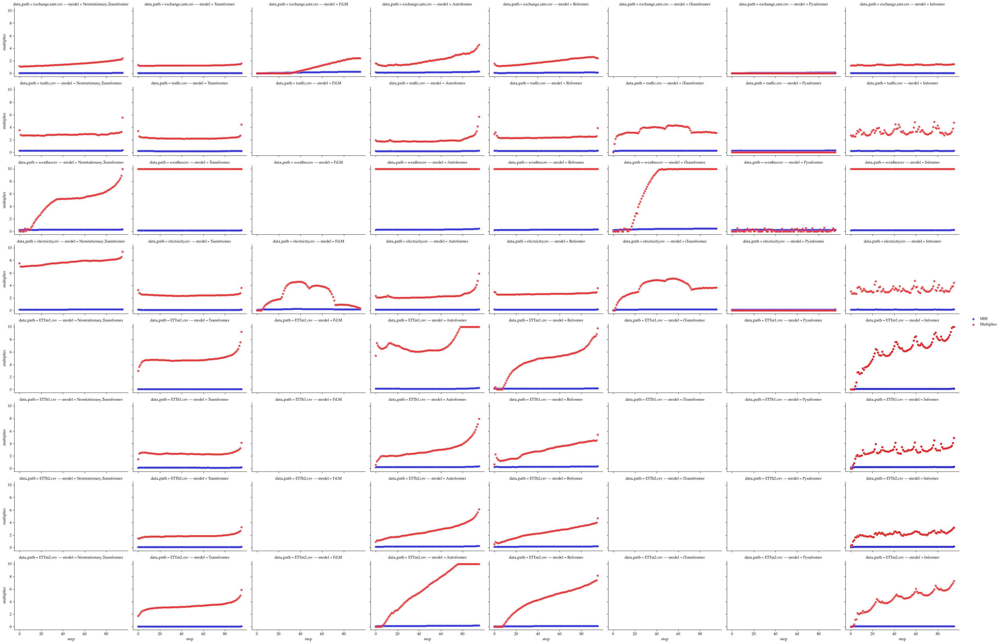

#### **Multipliers vs loss 192 (split=train, constraint_idx=1)**

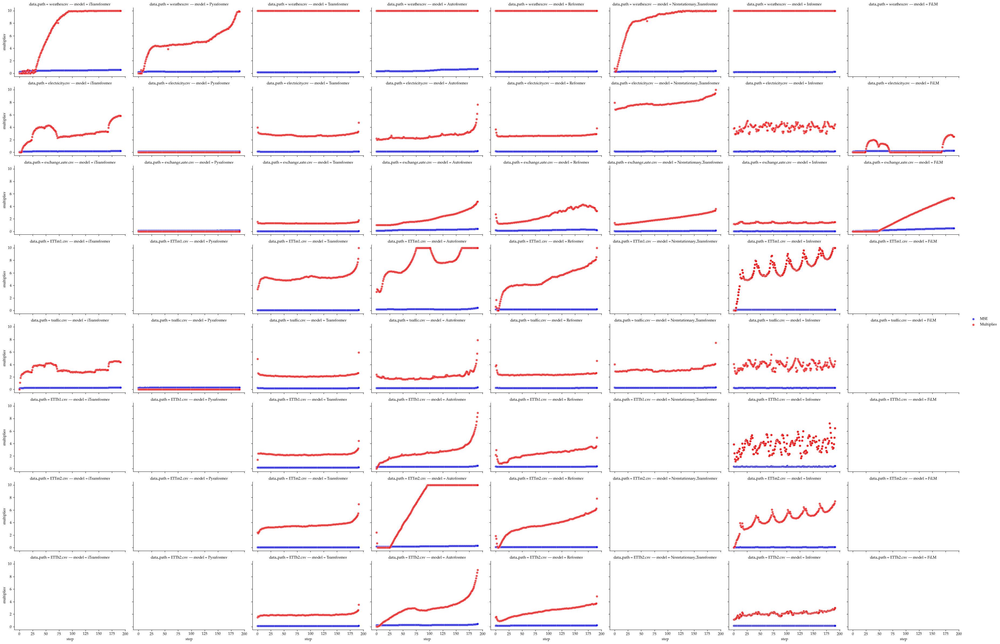

#### **Multipliers vs loss 336 (split=train, constraint_idx=1)**

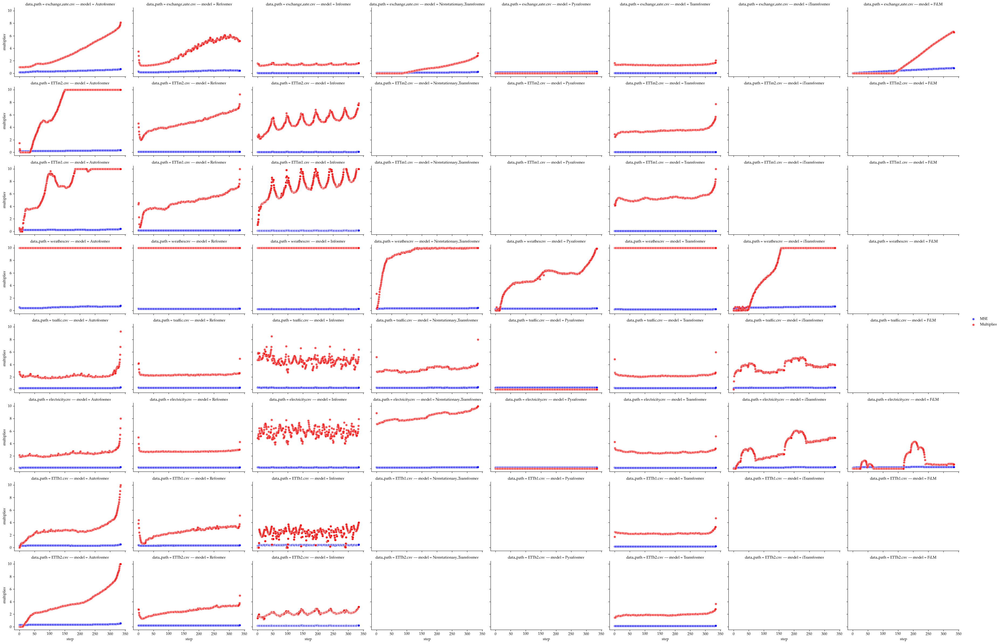

#### **Multipliers vs loss 720 (split=train, constraint_idx=1)**

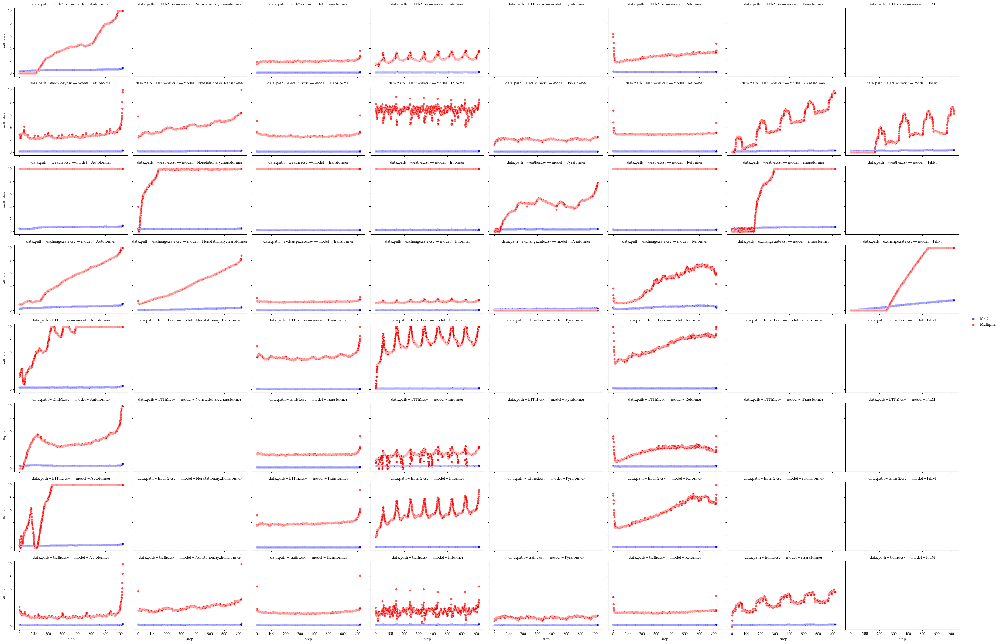

In [40]:
# PARAMS
split="train"
constraint_idx = 1 # use the 50 percentile constraint to plot 1=25,2=50,3=75
seed=2021

# Filter
df_pct50 = df_to_plot_nogs[
    (df_to_plot_nogs.constraint_idx.isin([0,constraint_idx])) 
    & (df_to_plot_nogs.seed==seed) & (df_to_plot_nogs.split==split)
    & (df_to_plot_nogs.constraint_type=="constant")
    ].copy()

PRED_LENS=sorted(df_to_plot_nogs.pred_len.unique().tolist())
#PRED_LENS=[96]
for pred_len in PRED_LENS:
    # Add data for constant line
    df_current_plot = df_pct50.query('pred_len==@pred_len').copy()
    #constraint_level = df_current_plot.constraint_level.unique()[0]
    #df_current_plot['constraint_level'] = constraint_level
    display(Markdown(f"#### **Multipliers vs loss {pred_len} (split={split}, constraint_idx={constraint_idx})**"))

    g = sns.FacetGrid(df_current_plot, col='model', row='data_path', height=3, aspect=1.5, legend_out=True)
    # Plot multipliers and MSEs
    g.map(sns.scatterplot, "step", "mse", alpha=.7,color='blue',label='MSE')
    g.map(sns.scatterplot, "step", "multiplier", alpha=.7,color='red',label='Multiplier')
    # Add legend the series

    g.add_legend()
    #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_{pred_len}_{str(constraint_level).replace('.','')}.png")
    plt.show()

### Does shape prevail when extending window length

In [ ]:
model="Reformer"
data_path="weather.csv"
pred_len=720
split='test'

#seaborn params
plt.rcParams['lines.linewidth'] = 1.8
sns.set_context("talk", font_scale=0.8)
backup = plt.rcParams
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
})
#sns.set_palette(sns.cubehelix_palette())
#sns.set_palette("tab10")
sns.set_palette("muted")
#sns.set_palette("Greys")

# Filter data
#to_plot = df_to_plot.query('model==@model & data_path==@data_path & split==@split & constraint_type=="erm"').copy()
# for model in df_to_plot.model.unique():
#     for data_path in df_to_plot.data_path.unique():
#         #for pred_len in df_to_plot.pred_len.unique():
#         to_plot = df_to_plot.query('model==@model & data_path==@data_path & split==@split & constraint_type=="erm"').copy()
#         #to_plot.loc[to_plot.constraint_level==-1.0,'constraint_level'] = to_plot.constraint_level.max()

#         to_plot.rename(columns={'mse':'MSE','step': "Prediction Step","pred_len":"Window Length"},inplace=True)
#         #display(to_plot.constraint_level)
#         # g = sns.scatterplot(data=to_plot,
#         #                     x="Prediction Step",
#         #                     y= "MSE",
#         #                     alpha=.7,hue='constraint_type',style='constraint_type',
#         #                     #palette={'ERM':'blue','Constrained':'red'},
#         #                     legend='full'
#         #                     )
#         display(Markdown(f"# {model} on {data_path} (pred_len={pred_len}, split={split})"))
#         g=sns.FacetGrid(to_plot, col="Window Length", col_wrap=2, height=4, aspect=1.5,sharex=False,sharey=False).map(sns.scatterplot, "Prediction Step", "MSE", alpha=.7)
#         g.map(sns.scatterplot, "Prediction Step", "MSE", alpha=.7)
#         #g.set_title(f"{model} on {data_path} (pred_len={pred_len}, split={split})")
#         plt.figure(figsize=(3.5, 2.6))
#         plt.show()
to_plot = df_to_plot.query('model==@model & data_path==@data_path & split==@split & type=="ERM"').copy()
#display(to_plot.run_id.nunique())
#to_plot.loc[to_plot.constraint_level==-1.0,'constraint_level'] = to_plot.constraint_level.max()

# to_plot.rename(columns={'mse':'MSE','step': "Prediction Step","pred_len":"Window Length"},inplace=True)
#display(to_plot.constraint_level)
# g = sns.scatterplot(data=to_plot,
#                     x="Prediction Step",
#                     y= "MSE",
#                     alpha=.9,hue='Window Length',style='Window Length',
#                     #palette={'ERM':'blue','Constrained':'red'},
#                     legend='full'
#                     )
#g.set_title(f"{model} on {data_path} (pred_len={pred_len}, split={split})")
#g.set_title("")
#plt.figure(figsize=(3.5, 2.6))  # Width, height in inches (standard on papers according to chatGPT)

#plt.savefig(f'../figures/icml/shape_across_lengths_{model}_{data_path[:4]}.pdf', bbox_inches='tight')  # For a PGF file

# Another option
to_plot.rename(columns={'mse':'MSE','step': "Prediction Step","pred_len":"Window Length"},inplace=True)
g=sns.FacetGrid(to_plot, 
                col="Window Length", 
                col_wrap=2, 
                height=4, 
                aspect=1.25,
                sharex=False,
                sharey=False
                )
g.map(sns.scatterplot, "Prediction Step", "MSE", alpha=.7,marker='+')
plt.savefig(f'../figures/icml/shape_across_lengths_{model}_{data_path[:4]}.pdf', bbox_inches='tight')
# g = sns.scatterplot(data=to_plot,
#                     x="Prediction Step",
#                     y= "MSE", 
#                     alpha=.7,hue='Window Length',style='Window Length',
#                     #palette={'ERM':'blue','Constrained':'red'},
#                     legend='full')

plt.rcParams.update(backup)
#g2 = sns.lineplot(data=to_plot.query("constraint_type=='constant'"),x="Prediction Step",y= "constraint_level", alpha=.7,color='green',label='Constraint Level')

### Is train correlated with test?

In [ ]:
model="Autoformer"
data_path="exchange_rate.csv"
pred_len=720

dd=df_to_plot.query('model==@model & data_path==@data_path & type=="ERM" & pred_len==@pred_len')
# Create a dataset of mse train and mse test for each step with dd using melt
dd_train = dd.query('split=="train"').copy()
dd_test = dd.query('split=="test"').copy()

dd_plot=dd_train.merge(dd_test,on="step",suffixes=('_train','_test'))[['step','mse_train','mse_test']]
#dd2['diff'] = dd2.test-dd2.train

sns.scatterplot(dd_plot, x="mse_train", y="mse_test", alpha=.7,)

### PAPER: Singular ERM vs Constrained 
Of ERM vs constrained

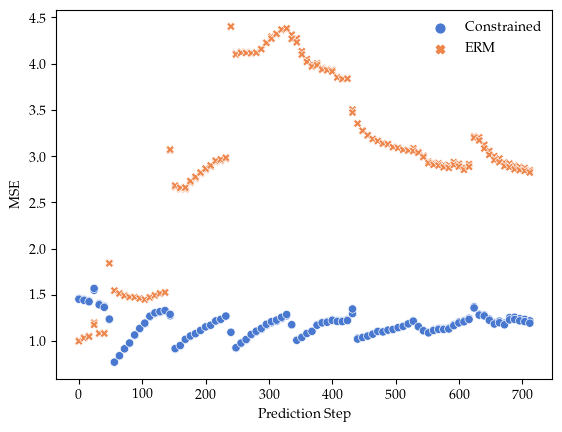

In [41]:
# #Option 1
# model="Autoformer"
# data_path="exchange_rate.csv"
# pred_len=336
# split='test'

# # Option 2
# model="Transformer"
# data_path="exchange_rate.csv"
# pred_len=720
# split='test'

# # Option 3
model="Informer"
data_path="exchange_rate.csv"
pred_len=720
split='test'

# # Option 4
# model="Autoformer"
# data_path="weather.csv"
# pred_len=96
# split='test'

#seaborn params
plt.rcParams['lines.linewidth'] = 1.8
#sns.set_context("talk", font_scale=0.8)
backup = plt.rcParams
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
})

#sns.set_palette(sns.cubehelix_palette())
#sns.set_palette("tab10")
sns.set_palette("muted")
#sns.set_palette("Greys")

# Filter data
to_plot = df_to_plot.query('model==@model & data_path==@data_path & pred_len==@pred_len & split==@split').copy()
to_plot.loc[to_plot.constraint_level==-1.0,'constraint_level'] = to_plot.constraint_level.max()

#Sample every other datapoint
to_plot = to_plot[to_plot.step%8==0]

to_plot.rename(columns={'mse':'MSE','step': "Prediction Step"},inplace=True)
#display(to_plot.constraint_level)
g = sns.scatterplot(data=to_plot,
                    x="Prediction Step",
                    y= "MSE", 
                    hue='type',
                    style='type',
                    #marker='+',
                    #palette={'ERM':'blue','Constrained':'red'},
                    legend='full'
                    )
#g.set_title(f"{model} on {data_path} (pred_len={pred_len}, split={split})")
#plt.figure(figsize=(3.5, 2.6))  # Width, height in inches (standard on papers according to chatGPT)

# remove borders from legend
g.get_legend().get_frame().set_linewidth(0.0)
g.get_legend().set_title("")

# Set the size of the markers
g.legend_.legendHandles[0]._sizes = [40]

# make legend marker a + instead of a dot using handlers manually
#g.legend(handles=g.legend_.legendHandles, labels=["ERM", "Constrained"], title="Type", loc="upper left")



#g.set_xlabels("")
#g.set_ylabels("")
#g.set_titles(col_template="{col_name}")
#g.fig.supxlabel("Prediction Step")
#g.fig.supylabel("MSE")
# for ax in g.axes.flat:
#     ax.set_title("", fontsize='large')
#     ax.set_xlabel(ax.get_xlabel(), fontsize='large')
#     ax.set_ylabel(ax.get_ylabel(), fontsize='large')

# make markers bigger
# for ax in g.axes.flat:
#     for p in ax.patches:
#         p.set( markersize=20)
# disable legend
#g._legend.remove()
# tight layout
#g.tight_layout()
#g.savefig(f"../figures/icml/{figname}.pdf")


plt.savefig(f'../figures/icml/erm_vs_constrained_fp_{model}_{data_path[:4]}_{pred_len}.pdf', bbox_inches='tight')  # For a PGF file
#plt.show()
plt.rcParams.update(backup)
#g2 = sns.lineplot(data=to_plot.query("constraint_type=='constant'"),x="Prediction Step",y= "constraint_level", alpha=.7,color='green',label='Constraint Level')

### PAPER: ERM vs Constrained across models on two datasets

Saved to ../figures/icml_monotonic_2024-04-16/constrained_vs_erm_allmodels_exch_720.pdf
Saved to ../figures/icml_monotonic_2024-04-16/constrained_vs_erm_allmodels_weather_96.pdf


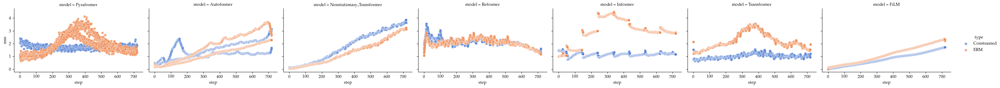

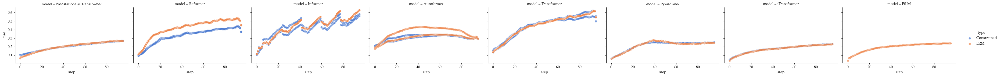

In [43]:
df_set1 = df_to_plot.query('data_path=="exchange_rate.csv" and pred_len==720 and split=="test"').copy()
df_set2 = df_to_plot.query('data_path=="weather.csv" and pred_len==96 and split=="test"').copy()

#Params for latex
backup = plt.rcParams
sns.set_palette("muted")
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
}
)

#plot 1
g=sns.FacetGrid(df_set1, col='model', hue='type', height=3, aspect=1.5, legend_out=True)
g.map(sns.scatterplot, "step", "mse", alpha=.7,legend='full')
g.add_legend()
#TODO fix and uncomment
figure1_dir = f"{FIGURES_FOLDER}/constrained_vs_erm_allmodels_exch_720.pdf"
print(f"Saved to {figure1_dir}")
g.savefig(figure1_dir)

#plot 2
g=sns.FacetGrid(df_set2, col='model', hue='type', height=3, aspect=1.5, legend_out=True)
g.map(sns.scatterplot, "step", "mse", alpha=.7)
g.add_legend()
#TODO fix and uncomment
figure1_dir = f"{FIGURES_FOLDER}/constrained_vs_erm_allmodels_weather_96.pdf"
print(f"Saved to {figure1_dir}")
g.savefig(figure1_dir)

#restoring parameters
plt.rcParams.update(backup)

### (old) ERM vs constrained

In [ ]:
from IPython.display import display, Markdown
to_plot = df_to_plot[(df_to_plot.split=='test')].copy()
for (data_path,pred_len), series in to_plot.groupby(['data_path',"pred_len"]):
    constraints = series.constraint_idx.unique()
    print(constraints)
    constraints = constraints[constraints!=-1] # to iterate over all constraints explored.
    for constraint_idx in constraints:
        display(Markdown(f"### Dataset: {data_path} pred_len: {pred_len} constraint_idx: {constraint_idx}"))
        plot_series = series#series[series["constraint_idx"]==constraint_idx]
        
        #means_per_experiment = plot_series.groupby(['pred_len','constraint_level','Algorithm','model','epoch','type'])['mse'].mean().reset_index()
        #display(means_per_experiment)
        # do a pivot where model are the rows, and the columns constrained and unconstrained
        #display(means_per_experiment.pivot(index=['model'], columns='type', values='mse').reset_index())

        # sns.scatterplot(x="step", y="mse", hue="Algorithm",style="split", data=plot_series)
        
        # plt.axhline(y=constraint_level, color='r', linestyle='-')
        # plt.title(f"Pred Length: {pred_len}, Constraint_level: {constraint_level}")
        # plt.show()

        # This same scatterplot but in a grid by algorithm. 
        g = sns.FacetGrid(plot_series, col="model", hue="type")
        g.map(sns.scatterplot, "step", "mse", alpha=.7)
        g.add_legend()
        # add the hline
        # for ax in g.axes:
        #     ax.axhline(y=constraint_level, color='r', linestyle='-')
        plt.show()
        # export this plot to latex. Remove the dot in constraint_level decimal
        #TODO fix
        #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_{data_path.replace('.','')}_{pred_len}_{str(constraint_level).replace('.','')}.png")
        # Fix [Errno 2] No such file or directory: 'figures/electricity.csv_96_0.17_individual.png'


### Loss shaping single instance qualitative analysis

### Plotting dual variables

In [ ]:
df_to_plot[['run_id','pred_len','constraint_level','data_path','model','type']].drop_duplicates().query("data_path=='weather.csv' and model=='Reformer' and type=='Constrained'")

In [ ]:
# #df_to_plot.query('split=="train" and pred_len==96').run_id.head(1)
# #mult_cols = [f"multiplier/{i}" for i in range(0,96)]
# # Plot for every constraint level in the 96 pred len window
# #for pred_len in df_to_plot.pred_len.unique():
# display(Markdown(f"# Multipliers for window of {pred_len}"))
# # sns.scatterplot(x="step", y="multiplier", hue="model",style="constraint_level", 
# #     data=df_to_plot.query(f"split=='train' and type=='Constrained' and pred_len=={96} and data_path=='weather.csv'"))
# # same plot, but grid with one plot per model
# dd = df_to_plot#df_to_plot.query("run_id=='6fgam2dx' and split=='train'")#.query(f"split=='train' and type=='Constrained' and pred_len==96 and data_path=='electricity.csv' and model=='Reformer' and constraint_level==0.157")
# dd_test = df_to_plot#df_to_plot.query("run_id=='6fgam2dx' and split=='test'")#.query(f"split=='test' and type=='Constrained' and pred_len==96 and data_path=='electricity.csv' and model=='Reformer' and constraint_level==0.157")

# #print(dd_test.constraint_level.unique())
# test_set_plus_multipliers = dd[['step','multiplier']].merge(dd_test[['step','split','mse']],on='step')

# unioned = pd.concat([dd[['step','split','multiplier','mse']],test_set_plus_multipliers[['step','split','multiplier','mse']]])

# display(unioned)


# display(test_set_plus_multipliers)

# #constraint_level==0.553
# # mult on x, mse@train and mse@test on y. hue=split
# # Add step over every point
# sns.scatterplot(unioned,x="multiplier", y="mse",hue='split', alpha=.3,legend='full')



# g = sns.FacetGrid(dd, col="model", row="constraint_level")
# g.map(sns.scatterplot, "step", "multiplier", alpha=.3)
# #g.map(sns.scatterplot, "step", "mse", alpha=.3)

## Result tables
1. Reproduce the pivot table from notebook 11, perhaps add standard deviation reports.
2. Explore and find other interesting table visualziation

In [45]:
#DEBUG
pd.set_option('display.max_rows',None)
#summary_metrics[summary_metrics.data_path.isin(['weather.csv','electricity.csv','exchange_rate.csv'])].groupby(['data_path','model','pred_len']).size().sort_values().reset_index()
summary_metrics.query('model=="Autoformer"').groupby(['data_path','pred_len'])['mae'].mean()

data_path             pred_len
ETTh1.csv             96          0.489000
                      192         0.515430
                      336         0.545107
                      720         0.621275
ETTh2.csv             96          0.378563
                      192         0.414677
                      336         0.427430
                      720         0.492310
ETTm1.csv             96          0.416328
                      192         0.482177
                      336         0.477415
                      720         0.547780
ETTm2.csv             96          0.273760
                      192         0.322685
                      336         0.345395
                      720         0.390290
electricity.csv       96          0.276325
                      192         0.298891
                      336         0.317304
                      720         0.334936
exchange_rate.csv     96          0.317052
                      192         0.556107
                      3

### PAPER: Result Pivot per metric/dataset

In [46]:
import itertools
def style_pivot_table_best_per_params(pivoted_df):
    pivoted_df=pivoted_df.copy()
    pivoted_df.columns.names = ['metric','constraint_type','model']
    mask = pd.DataFrame(False, index=pivoted_df.index, columns=pivoted_df.columns)
    for keys,subset in  pivoted_df.groupby(level=['metric','model'],axis=1):
        mask.loc[:,subset.columns] = subset.eq(subset.min(axis=1), axis=0)
        
    ##STYLE
    # truncate to 4 decimals for display
    pivoted_df=pivoted_df.style.format("{:.3f}")
    pivoted_df=pivoted_df.apply(lambda s: ['font-weight: bold;text-decoration: underline' if v else '' for v in mask.loc[s.name]], axis=1)
    return pivoted_df

def data_path_renaming(x):
    if x=="exchange_rate.csv":
        x='Exchange'
    x=x.replace(".csv","")
    if x=="electricity":
        x="ECL"
    else: 
        x=x.replace(".csv","").replace("_"," ").title()
    return latex_scaffolding_dataset(x)
def latex_scaffolding_dataset(x):
    # Add rotatebox
    x=r'\rotatebox'+'{90}{'+x+'}'
    x=r'\multirow{4}{*}{'+x+'}'
    return x
def text_bf(x):
    return r'\textbf{'+str(x)+'}'

def latex_style_best(pivoted_df):
    pivoted_df=pivoted_df.copy()
    pivoted_df.columns.names = ['metric','constraint_type','model']
    mask = pd.DataFrame(False, index=pivoted_df.index, columns=pivoted_df.columns)
    for keys,subset in  pivoted_df.groupby(level=['metric','model'],axis=1):
        mask.loc[:,subset.columns] = subset.eq(subset.min(axis=1), axis=0)
    #if mask is true, add text_bf
    boldface_df = pivoted_df.copy().applymap(lambda x: f"{x:.3f}")
    boldface_df[mask] = boldface_df.applymap(text_bf)
    return boldface_df


pd.set_option('display.max_columns', None)
def compute_pivot_over_metric(summary_metrics,pivot_value_columns=['window_std'],split='test'):
    pivoted_tables=[]
    data_paths=summary_metrics.data_path.unique()
    for data_path in data_paths:
        tp2=summary_metrics.query(f'data_path==@data_path and split==@split').copy()

        #GROUPING TEH VALS
        grouped_values=tp2.groupby(['pred_len','model','constraint_type'])[[
            'mse',
            #'mcv',
            'mae',
            'std_mse',
            #'std_mcv',
            'mean_infeasible_rate',
            'std_infeasible_rate',
            'window_std'
            ]].mean().reset_index()
        
        # Pivot of models versus constrained and ERM, values are mse and mse_diff
        all_results = grouped_values
        
        # Pivot all results, sort ascending by pred_len, then mean_violation on constrained
        pivoted=all_results.pivot(
            index=['pred_len'],
            columns=['constraint_type','model'], 
            values=pivot_value_columns
        )
        
        pivoted=style_pivot_table_best_per_params(pivoted)
        #display(pivoted)
        pivoted_tables.append(pivoted)
    result_table = pd.concat([d.data for d in pivoted_tables],keys=data_paths,names=['data_path'])

    return result_table
display(Markdown(f"# Pivot tables for split=test"))

#THIS RUNS OLD DATASETS ALL MODELS
summary_metrics_to_plot = summary_metrics[summary_metrics.data_path.isin(['weather.csv','electricity.csv','exchange_rate.csv'])].query("constraint_type!='monotonic_resilience'").copy()
# THIS RUNS ALL DATASETS OLD MODELS
#summary_metrics_to_plot = summary_metrics[summary_metrics.model.isin(['Autoformer','Reformer','Informer','Transformer'])].query("constraint_type!='constant_resilience' and data_path!='national_illness.csv'").copy()
# THIS IS ILLNESS
#summary_metrics_to_plot = summary_metrics[summary_metrics.model.isin(['Autoformer','Reformer','Informer','Transformer'])].query("data_path=='national_illness.csv'").copy()
#print(summary_metrics_to_plot.pred_len.unique())

# rename constraint_types to be more readable
summary_metrics_to_plot['constraint_type'] = summary_metrics_to_plot['constraint_type'].replace({
    'constant':'1Ours',
    'erm':'3ERM',
    'constant_resilience':'2Ours+R',
    'monotonic': '1Ours'
})

# FILLING BLANKS TO NOT BREKA THE TABLE
base_df=summary_metrics_to_plot
models = base_df.model.unique()
pred_lens = [96, 192, 336, 720] 
#pred_lens = [24, 36, 48, 60] #ILLNESS
constraint_type=base_df.constraint_type.unique()
split=base_df.split.unique()
data_paths=base_df.data_path.unique()
# Create a dataframe with all expected keys by crossjoining
keys = ['model','pred_len','constraint_type','split','data_path']
print(len(models)*len(pred_lens)*len(constraint_type)*len(split)*len(data_paths))
df_keys = pd.DataFrame(list(itertools.product(*[models,pred_lens,constraint_type,split,data_paths])),columns=keys)
#df_keys.merge(base_df,how='left',on=keys)['mse']
filler=9999
summary_metrics_to_plot=df_keys.merge(base_df,how='left',on=keys).fillna({'mse':filler,'mae':filler,'rmse':filler,'window_std':filler})

for metric in [
    #'mcv',
    'mse',
    'mae',#TODO broken for new models
    #'mean_infeasible_rate',
    'window_std',
    ]:
    result_table = compute_pivot_over_metric(summary_metrics_to_plot,pivot_value_columns=[metric],split='test')
    display(Markdown(f"## {metric}"))
    # add bold
    display(style_pivot_table_best_per_params(result_table.replace({filler:np.nan})))
    #latex styling
    latex_table=result_table.copy()

    latex_table.index=latex_table.index \
        .set_levels([data_path_renaming(level) for level in latex_table.index.levels[0]],level=0)

    latex_table=latex_style_best(latex_table)
    
    # drop the metric level in the multiindex
    latex_table.columns=latex_table.columns.droplevel(0)

    # Swap the column multiindex to model on top
    latex_table=latex_table.swaplevel(0,1,axis=1)

    #latex_table=style_pivot_table_best_per_params(latex_table)
    # Show only :.4f
    # Rename data_path to None
    latex_table=latex_table.rename_axis(index={'data_path':None,'pred_len':''},columns={'model':'','constraint_type':''})
    #display(latex_table.columns)
    # refactor the multiindex in columns so that repeated models merge
    #print(latex_table.to_latex(escape=False,index_names=False,multicolumn_format='c',multicolumn=True))
    print(latex_table.to_latex(escape=False,multicolumn_format='c',multicolumn=True,column_format='cc|ccc|ccc|ccc|ccc'))
    #to markdown
    print(result_table.to_markdown())
    


# Pivot tables for split=test

864


## mse

\begin{tabular}{cc|ccc|ccc|ccc|ccc}
\toprule
                                         &     & \multicolumn{3}{c}{Autoformer} & \multicolumn{3}{c}{FiLM} & \multicolumn{3}{c}{Informer} & \multicolumn{3}{c}{Nonstationary_Transformer} & \multicolumn{3}{c}{Pyraformer} & \multicolumn{3}{c}{Reformer} & \multicolumn{3}{c}{Transformer} & \multicolumn{3}{c}{iTransformer} \\
                                         &     &           1Ours &         2Ours+R &            3ERM &              1Ours &            2Ours+R &               3ERM &           1Ours &         2Ours+R &            3ERM &                     1Ours &   2Ours+R &            3ERM &           1Ours &   2Ours+R &            3ERM &           1Ours &         2Ours+R &            3ERM &           1Ours &         2Ours+R &            3ERM &              1Ours &            2Ours+R &               3ERM \\
{} & {} &                 &                 &                 &                    &                    &                    &         

## mae

\begin{tabular}{cc|ccc|ccc|ccc|ccc}
\toprule
                                         &     & \multicolumn{3}{c}{Autoformer} & \multicolumn{3}{c}{FiLM} & \multicolumn{3}{c}{Informer} & \multicolumn{3}{c}{Nonstationary_Transformer} & \multicolumn{3}{c}{Pyraformer} & \multicolumn{3}{c}{Reformer} & \multicolumn{3}{c}{Transformer} & \multicolumn{3}{c}{iTransformer} \\
                                         &     &           1Ours &   2Ours+R &            3ERM &              1Ours &            2Ours+R &               3ERM &           1Ours &   2Ours+R &            3ERM &                     1Ours &   2Ours+R &            3ERM &           1Ours &   2Ours+R &            3ERM &           1Ours &   2Ours+R &            3ERM &           1Ours &   2Ours+R &            3ERM &              1Ours &            2Ours+R &               3ERM \\
{} & {} &                 &           &                 &                    &                    &                    &                 &           &         

## window_std

\begin{tabular}{cc|ccc|ccc|ccc|ccc}
\toprule
                                         &     & \multicolumn{3}{c}{Autoformer} & \multicolumn{3}{c}{FiLM} & \multicolumn{3}{c}{Informer} & \multicolumn{3}{c}{Nonstationary_Transformer} & \multicolumn{3}{c}{Pyraformer} & \multicolumn{3}{c}{Reformer} & \multicolumn{3}{c}{Transformer} & \multicolumn{3}{c}{iTransformer} \\
                                         &     &           1Ours &         2Ours+R &            3ERM &              1Ours &            2Ours+R &               3ERM &           1Ours &         2Ours+R &   3ERM &                     1Ours &   2Ours+R &            3ERM &           1Ours &   2Ours+R &   3ERM &           1Ours &         2Ours+R &            3ERM &           1Ours &         2Ours+R &            3ERM &              1Ours &            2Ours+R &               3ERM \\
{} & {} &                 &                 &                 &                    &                    &                    &                 &         

### REVIEWERS: Percentage difference tables and histograms
In order to emphasize the effect of our method, we want to compute the percentage difference between ERM and constrained runs

#### Tables

In [55]:
from functools import partial

def _apply_multiple(df_s,apply_funcs):
    outs = []
    for name,func in apply_funcs:
        out_series=df_s.apply(func)
        out_series.name = name
        outs.append(out_series)
    return pd.concat(outs,axis=1).reset_index()
        

def _pct_diff(df_s,metric='mse',baseline_constraint_type='erm',comparison_constraint_type='constant'):
    # WARN: Assumes there is one and only one comparison and baseline row in each group.
    if not baseline_constraint_type in  df_s.constraint_type.unique():
        raise ValueError("There should be one and only one comparison and baseline row in each group.")
    comparison = df_s[df_s.constraint_type==comparison_constraint_type][metric].to_list()[0]
    baseline = df_s[df_s.constraint_type==baseline_constraint_type][metric].to_list()[0]
    # print(df_s)
    # print("---")
    # print(comparison)
    # print(baseline)
    # print("Dividing...")
    if np.isclose(baseline,0) or np.isclose(comparison,0):
        return 0.0
    pct_increase = (comparison-baseline)*100/baseline
    
    return pct_increase
acc = []

# MCV only makes sense when there is a constant constraint.
metrics_for_pct_diff = ['mse','mcv','window_std','monotonic_rate'] if CONSTRAINT_TYPE=='constant' else ['mse','window_std','monotonic_rate']

#for data_path in ['weather.csv','electricity.csv','exchange_rate.csv']:
data_paths=summary_metrics.query('data_path!="traffic.csv"').data_path.unique().tolist()
for data_path in data_paths:
    #non resilience
    # dd_summary = summary_metrics[summary_metrics.data_path.isin(['weather.csv','electricity.csv','exchange_rate.csv'])].query(f"constraint_type!='{CONSTRAINT_TYPE}_resilience'").copy() \
    #         .query("data_path==@data_path and split=='test'") \
    #         .groupby(['pred_len','model','data_path','constraint_type'])[metrics_for_pct_diff].mean().reset_index()
    #resilience
    dd_summary = summary_metrics[summary_metrics.constraint_type.isin(['erm',CONSTRAINT_TYPE])].copy() \
            .query("data_path==@data_path and split=='test'") \
            .groupby(['pred_len','model','data_path','constraint_type'])[metrics_for_pct_diff].mean().reset_index()
    
    #Get a single metric from some constraint type run
    _single_metric = lambda x,ct,metric: x.query('constraint_type==@ct')[metric].mean()
    
    # This scary looking piece is just generating functions to compute each comparison metric in metrics_for_pct_diff and flattening the list.
    apply_funcs = [metric_func for sublist in ([
        (f'erm_{m}',partial(_single_metric,ct='erm',metric=m)),
        (f'{CONSTRAINT_TYPE}_{m}',partial(_single_metric,ct=CONSTRAINT_TYPE,metric=m)),
        (f'{m}_pct_diff',partial(_pct_diff, metric=m, baseline_constraint_type='erm', comparison_constraint_type=CONSTRAINT_TYPE)),
        ] for m in metrics_for_pct_diff) for metric_func in sublist]
    
    mse_pct_changes=_apply_multiple(
        dd_summary.groupby(['pred_len', 'model','data_path']),
        apply_funcs=apply_funcs
    )
    # display(f"MSE PCT DIFF {mse_pct_changes['mse_pct_diff'].mean()}")
    # display(f"MCV PCT DIFF {mse_pct_changes['mcv_pct_diff'].mean()}")
    #display(f"WINDOW PCT DIFF {mse_pct_changes['window_std_pct_diff'].mean()}")
    display(mse_pct_changes)
    acc.append(mse_pct_changes[['model','data_path','pred_len'] + [f'{CONSTRAINT_TYPE}_{m}' for m in metrics_for_pct_diff] + [f'erm_{m}' for m in metrics_for_pct_diff] + [f'{m}_pct_diff' for m in metrics_for_pct_diff]])
pct_diffs_all_ds = pd.concat(acc,axis=0)
pct_diffs_all_ds

,pred_len,model,data_path,erm_mse,constant_mse,mse_pct_diff,erm_mcv,constant_mcv,mcv_pct_diff,erm_window_std,constant_window_std,window_std_pct_diff,erm_monotonic_rate,constant_monotonic_rate,monotonic_rate_pct_diff
0,96,Autoformer,ETTh1.csv,0.67871,0.72397,6.668533,0.38871,0.43397,11.643642,0.02408,0.04563,89.493355,1.0,1.0,0.0
1,96,Informer,ETTh1.csv,0.88962,0.88428,-0.600256,0.61962,0.61428,-0.861819,0.18317,0.16369,-10.634929,1.0,1.0,0.0
2,96,Reformer,ETTh1.csv,0.78917,0.79594,0.857863,0.50617,0.51294,1.337495,0.05808,0.05771,-0.637052,1.0,1.0,0.0
3,96,Transformer,ETTh1.csv,0.86579,0.81350,-6.039571,0.71679,0.66450,-7.295024,0.14607,0.12432,-14.890121,1.0,1.0,0.0
4,192,Autoformer,ETTh1.csv,0.86862,0.83783,-3.544703,0.56262,0.53183,-5.472610,0.13863,0.14082,1.579745,1.0,1.0,0.0
5,192,Informer,ETTh1.csv,1.17891,1.06499,-9.663163,0.87391,0.75999,-13.035667,0.21063,0.17924,-14.902910,1.0,1.0,0.0
6,192,Reformer,ETTh1.csv,0.81839,0.79699,-2.614890,0.49339,0.47199,-4.337340,0.07743,0.06302,-18.610358,1.0,1.0,0.0
7,192,Transformer,ETTh1.csv,0.98758,0.96110,-2.681302,0.81358,0.78710,-3.254751,0.16634,0.15123,-9.083804,1.0,1.0,0.0
8,336,Autoformer,ETTh1.csv,0.85254,0.84976,-0.326084,0.49554,0.49276,-0.561004,0.08268,0.04928,-40.396710,1.0,1.0,0.0
9,336,Informer,ETTh1.csv,1.23704,1.23172,-0.430059,0.82504,0.81972,-0.644817,0.18053,0.15593,-13.626544,1.0,1.0,0.0


,pred_len,model,data_path,erm_mse,constant_mse,mse_pct_diff,erm_mcv,constant_mcv,mcv_pct_diff,erm_window_std,constant_window_std,window_std_pct_diff,erm_monotonic_rate,constant_monotonic_rate,monotonic_rate_pct_diff
0,96,Autoformer,ETTh2.csv,0.31399,0.29536,-5.933310,0.14699,0.12836,-12.674332,0.04113,0.04990,21.322636,1.00000,1.00000,0.000000
1,96,Informer,ETTh2.csv,0.43294,0.41429,-4.307756,0.29594,0.27729,-6.301953,0.13777,0.12611,-8.463381,1.00000,1.00000,0.000000
2,96,Reformer,ETTh2.csv,0.56242,0.62635,11.366950,0.40042,0.46435,15.965736,0.26240,0.30376,15.762195,1.00000,1.00000,0.000000
3,96,Transformer,ETTh2.csv,0.27432,0.28269,3.051181,0.18532,0.19369,4.516512,0.04969,0.05650,13.704971,1.00000,1.00000,0.000000
4,192,Autoformer,ETTh2.csv,0.33981,0.31900,-6.124010,0.06581,0.04560,-30.709619,0.01460,0.02298,57.397260,0.89062,0.93229,4.678763
5,192,Informer,ETTh2.csv,0.64780,0.64663,-0.180611,0.49680,0.49563,-0.235507,0.25092,0.24901,-0.761199,1.00000,1.00000,0.000000
6,192,Reformer,ETTh2.csv,1.24558,1.14173,-8.337481,1.05958,0.95573,-9.801053,0.71824,0.58411,-18.674816,1.00000,1.00000,0.000000
7,192,Transformer,ETTh2.csv,0.31615,0.32669,3.333861,0.21115,0.22169,4.991712,0.05328,0.05809,9.027778,1.00000,1.00000,0.000000
8,336,Autoformer,ETTh2.csv,0.39936,0.33359,-16.468850,0.06119,0.00071,-98.839680,0.07877,0.02026,-74.279548,0.85119,0.58333,-31.468885
9,336,Informer,ETTh2.csv,0.67536,0.69356,2.694859,0.50136,0.51956,3.630126,0.20256,0.20271,0.074052,1.00000,1.00000,0.000000


,pred_len,model,data_path,erm_mse,constant_mse,mse_pct_diff,erm_mcv,constant_mcv,mcv_pct_diff,erm_window_std,constant_window_std,window_std_pct_diff,erm_monotonic_rate,constant_monotonic_rate,monotonic_rate_pct_diff
0,96,Autoformer,ETTm1.csv,0.60524,0.58803,-2.843500,0.48224,0.46503,-3.568762,0.06293,0.06066,-3.607183,1.0,1.0,0.0
1,96,Informer,ETTm1.csv,0.64640,0.67281,4.085705,0.53040,0.55681,4.979261,0.15726,0.15580,-0.928399,1.0,1.0,0.0
2,96,Reformer,ETTm1.csv,0.69684,0.78729,12.980024,0.53084,0.62129,17.039032,0.13692,0.09889,-27.775343,1.0,1.0,0.0
3,96,Transformer,ETTm1.csv,0.56895,0.56498,-0.697777,0.51995,0.51598,-0.763535,0.11410,0.10828,-5.100789,1.0,1.0,0.0
4,192,Autoformer,ETTm1.csv,0.82835,0.75150,-9.277479,0.64335,0.56650,-11.945286,0.09063,0.05617,-38.022730,1.0,1.0,0.0
5,192,Informer,ETTm1.csv,0.76764,0.77508,0.969204,0.63564,0.64308,1.170474,0.11966,0.09507,-20.549891,1.0,1.0,0.0
6,192,Reformer,ETTm1.csv,0.83002,0.84509,1.815619,0.65302,0.66809,2.307739,0.11643,0.08624,-25.929743,1.0,1.0,0.0
7,192,Transformer,ETTm1.csv,0.63697,0.64974,2.004804,0.57697,0.58974,2.213287,0.09824,0.10078,2.585505,1.0,1.0,0.0
8,336,Autoformer,ETTm1.csv,0.68529,0.65796,-3.988093,0.44229,0.41496,-6.179204,0.06186,0.06282,1.551891,1.0,1.0,0.0
9,336,Informer,ETTm1.csv,0.85699,0.84197,-1.752646,0.70699,0.69197,-2.124500,0.17025,0.17212,1.098385,1.0,1.0,0.0


,pred_len,model,data_path,erm_mse,constant_mse,mse_pct_diff,erm_mcv,constant_mcv,mcv_pct_diff,erm_window_std,constant_window_std,window_std_pct_diff,erm_monotonic_rate,constant_monotonic_rate,monotonic_rate_pct_diff
0,96,Autoformer,ETTm2.csv,0.16823,0.20756,23.378708,0.04240,0.07871,85.636792,0.03370,0.03831,13.679525,0.91667,1.0,9.090512
1,96,Informer,ETTm2.csv,0.19005,0.18372,-3.330702,0.12548,0.11875,-5.363405,0.06361,0.05408,-14.981921,1.00000,1.0,0.000000
2,96,Reformer,ETTm2.csv,0.18347,0.21108,15.048782,0.10024,0.12708,26.775738,0.05429,0.05864,8.012525,1.00000,1.0,0.000000
3,96,Transformer,ETTm2.csv,0.16195,0.16752,3.439333,0.12295,0.12852,4.530297,0.03884,0.03894,0.257467,1.00000,1.0,0.000000
4,192,Autoformer,ETTm2.csv,0.19072,0.17198,-9.825923,0.02890,0.01451,-49.792388,0.02705,0.02518,-6.913124,0.54688,0.0,0.000000
5,192,Informer,ETTm2.csv,0.22311,0.24580,10.169871,0.14917,0.17180,15.170611,0.06485,0.07275,12.181958,1.00000,1.0,0.000000
6,192,Reformer,ETTm2.csv,0.29652,0.33422,12.714151,0.20053,0.23822,18.795193,0.08902,0.08356,-6.133453,1.00000,1.0,0.000000
7,192,Transformer,ETTm2.csv,0.21331,0.22539,5.663119,0.16931,0.18139,7.134841,0.05440,0.05823,7.040441,1.00000,1.0,0.000000
8,336,Autoformer,ETTm2.csv,0.21375,0.19704,-7.817544,0.00000,0.00000,0.000000,0.04051,0.03787,-6.516909,0.04464,0.0,0.000000
9,336,Informer,ETTm2.csv,0.28918,0.28227,-2.389515,0.21518,0.20827,-3.211265,0.08036,0.07577,-5.711797,1.00000,1.0,0.000000


,pred_len,model,data_path,erm_mse,constant_mse,mse_pct_diff,erm_mcv,constant_mcv,mcv_pct_diff,erm_window_std,constant_window_std,window_std_pct_diff,erm_monotonic_rate,constant_monotonic_rate,monotonic_rate_pct_diff
0,96,Autoformer,electricity.csv,0.203610,0.20018,-1.684593,0.090610,0.08718,-3.785454,0.015275,0.01513,-0.949264,1.00000,1.00000,0.000000
1,96,FiLM,electricity.csv,0.239320,0.19848,-17.065018,0.050720,0.01382,-72.752366,0.050210,0.03067,-38.916550,0.98958,0.29167,-70.525880
2,96,Informer,electricity.csv,0.326280,0.31937,-2.117813,0.177280,0.17037,-3.897789,0.015285,0.01269,-16.977429,1.00000,1.00000,0.000000
3,96,Nonstationary_Transformer,electricity.csv,0.177580,0.18242,2.725532,0.115580,0.12042,4.187576,0.017320,0.01439,-16.916859,1.00000,1.00000,0.000000
4,96,Pyraformer,electricity.csv,0.285035,0.27963,-1.896258,0.091035,0.08563,-5.937277,0.019115,0.01526,-20.167408,1.00000,1.00000,0.000000
5,96,Reformer,electricity.csv,0.298675,0.29714,-0.513937,0.148675,0.14714,-1.032453,0.010555,0.01064,0.805306,1.00000,1.00000,0.000000
6,96,Transformer,electricity.csv,0.260960,0.25884,-0.812385,0.150960,0.14884,-1.404346,0.007930,0.00767,-3.278689,1.00000,1.00000,0.000000
7,96,iTransformer,electricity.csv,0.147770,0.15941,7.877106,0.028030,0.03809,35.890118,0.023690,0.02314,-2.321655,0.94792,0.15625,-83.516541
8,192,Autoformer,electricity.csv,0.224020,0.22632,1.026694,0.023805,0.02595,9.010712,0.018235,0.02132,16.918015,1.00000,1.00000,0.000000
9,192,FiLM,electricity.csv,0.265560,0.20021,-24.608375,0.032510,0.00132,-95.939711,0.044950,0.02927,-34.883204,0.99479,0.64062,-35.602489


,pred_len,model,data_path,erm_mse,constant_mse,mse_pct_diff,erm_mcv,constant_mcv,mcv_pct_diff,erm_window_std,constant_window_std,window_std_pct_diff,erm_monotonic_rate,constant_monotonic_rate,monotonic_rate_pct_diff
0,96,Autoformer,exchange_rate.csv,0.154610,0.17884,15.671690,0.014840,0.02220,49.595687,0.080680,0.08517,5.565196,0.22917,0.47917,109.089322
1,96,FiLM,exchange_rate.csv,0.162000,0.09426,-41.814815,0.014360,0.00000,0.000000,0.057890,0.04378,-24.373812,0.00000,0.00000,0.000000
2,96,Informer,exchange_rate.csv,0.876530,0.87223,-0.490571,0.838530,0.83423,-0.512802,0.278275,0.27374,-1.629683,1.00000,1.00000,0.000000
3,96,Nonstationary_Transformer,exchange_rate.csv,0.160210,0.15078,-5.886025,0.143210,0.13378,-6.584736,0.095470,0.08625,-9.657484,1.00000,1.00000,0.000000
4,96,Pyraformer,exchange_rate.csv,0.735535,0.76388,3.853658,0.020095,0.00423,-78.949988,0.185660,0.10418,-43.886675,1.00000,1.00000,0.000000
5,96,Reformer,exchange_rate.csv,0.959655,1.02532,6.842563,0.851655,0.91732,7.710282,0.116280,0.12137,4.377365,1.00000,1.00000,0.000000
6,96,Transformer,exchange_rate.csv,0.680390,0.59274,-12.882317,0.075835,0.00807,-89.358476,0.163320,0.10471,-35.886603,1.00000,1.00000,0.000000
7,192,Autoformer,exchange_rate.csv,2.052020,0.26589,-87.042524,0.791320,0.00000,0.000000,1.348940,0.11480,-91.489614,0.88542,0.00000,0.000000
8,192,FiLM,exchange_rate.csv,0.255810,0.18206,-28.829991,0.063670,0.02092,-67.143082,0.116420,0.09593,-17.600069,0.00000,0.00000,0.000000
9,192,Informer,exchange_rate.csv,1.109715,1.10997,0.022979,1.067715,1.06797,0.023883,0.305485,0.29898,-2.129401,1.00000,1.00000,0.000000


,pred_len,model,data_path,erm_mse,constant_mse,mse_pct_diff,erm_mcv,constant_mcv,mcv_pct_diff,erm_window_std,constant_window_std,window_std_pct_diff,erm_monotonic_rate,constant_monotonic_rate,monotonic_rate_pct_diff
0,24,Autoformer,national_illness.csv,3.17981,3.39763,6.850095,2.82081,3.03863,7.721895,0.11299,0.14001,23.913621,1.0,1.0,0.0
1,24,Informer,national_illness.csv,5.21304,5.19949,-0.259925,4.89704,4.88349,-0.276698,0.43839,0.46806,6.767946,1.0,1.0,0.0
2,24,Reformer,national_illness.csv,3.94800,3.92348,-0.621074,3.44200,3.41748,-0.712377,0.45897,0.46178,0.612240,1.0,1.0,0.0
3,24,Transformer,national_illness.csv,5.20333,5.27220,1.323575,4.92533,4.99420,1.398282,0.48975,0.50773,3.671261,1.0,1.0,0.0
4,36,Autoformer,national_illness.csv,3.21641,3.21327,-0.097624,2.82441,2.82127,-0.111174,0.19749,0.21257,7.635830,1.0,1.0,0.0
5,36,Informer,national_illness.csv,5.78508,5.79244,0.127224,5.47708,5.48444,0.134378,0.69979,0.69883,-0.137184,1.0,1.0,0.0
6,36,Reformer,national_illness.csv,4.06944,4.07187,0.059713,3.55444,3.55687,0.068365,0.77834,0.77202,-0.811984,1.0,1.0,0.0
7,36,Transformer,national_illness.csv,4.57128,4.53794,-0.729336,4.20428,4.17094,-0.793001,0.43632,0.43532,-0.229190,1.0,1.0,0.0
8,48,Autoformer,national_illness.csv,3.01291,2.73834,-9.113117,2.47991,2.20534,-11.071773,0.30843,0.23680,-23.224070,1.0,1.0,0.0
9,48,Informer,national_illness.csv,5.49985,5.47867,-0.385101,5.14485,5.12367,-0.411674,0.65124,0.77497,18.999140,1.0,1.0,0.0


,pred_len,model,data_path,erm_mse,constant_mse,mse_pct_diff,erm_mcv,constant_mcv,mcv_pct_diff,erm_window_std,constant_window_std,window_std_pct_diff,erm_monotonic_rate,constant_monotonic_rate,monotonic_rate_pct_diff
0,96,Autoformer,weather.csv,0.340000,0.30007,-11.744118,0.000000,0.00000,0.000000,0.050225,0.03337,-33.558985,0.57292,0.00000,0.000000
1,96,Informer,weather.csv,0.435270,0.39485,-9.286190,0.224960,0.18582,-17.398649,0.118230,0.10144,-14.201133,0.93750,0.93750,0.000000
2,96,Nonstationary_Transformer,weather.csv,0.203320,0.20377,0.221326,0.000000,0.00000,0.000000,0.054730,0.04706,-14.014252,0.00000,0.00000,0.000000
3,96,Pyraformer,weather.csv,0.217290,0.21807,0.358967,0.000000,0.00000,0.000000,0.055700,0.05251,-5.727110,0.00000,0.00000,0.000000
4,96,Reformer,weather.csv,0.422680,0.33418,-20.937825,0.018145,0.00000,0.000000,0.102270,0.08552,-16.378215,0.90625,0.57292,-36.781241
5,96,Transformer,weather.csv,0.448030,0.46160,3.028815,0.039880,0.04739,18.831494,0.126740,0.12632,-0.331387,0.95833,0.92708,-3.260881
6,96,iTransformer,weather.csv,0.173800,0.17618,1.369390,0.000000,0.00000,0.000000,0.046760,0.04543,-2.844311,0.00000,0.00000,0.000000
7,192,Autoformer,weather.csv,0.302720,0.31130,2.834302,0.002160,0.00136,-37.037037,0.052530,0.05091,-3.083952,0.00000,0.00000,0.000000
8,192,Informer,weather.csv,0.518720,0.44737,-13.755012,0.044310,0.01927,-56.510946,0.154380,0.12887,-16.524161,1.00000,0.93750,-6.250000
9,192,Nonstationary_Transformer,weather.csv,0.271420,0.28253,4.093287,0.034350,0.03845,11.935953,0.084540,0.08094,-4.258339,0.48958,0.33854,-30.850933


,model,data_path,pred_len,constant_mse,constant_mcv,constant_window_std,constant_monotonic_rate,erm_mse,erm_mcv,erm_window_std,erm_monotonic_rate,mse_pct_diff,mcv_pct_diff,window_std_pct_diff,monotonic_rate_pct_diff
0,Autoformer,ETTh1.csv,96,0.72397,0.43397,0.04563,1.00000,0.678710,0.388710,0.024080,1.00000,6.668533,11.643642,89.493355,0.000000
1,Informer,ETTh1.csv,96,0.88428,0.61428,0.16369,1.00000,0.889620,0.619620,0.183170,1.00000,-0.600256,-0.861819,-10.634929,0.000000
2,Reformer,ETTh1.csv,96,0.79594,0.51294,0.05771,1.00000,0.789170,0.506170,0.058080,1.00000,0.857863,1.337495,-0.637052,0.000000
3,Transformer,ETTh1.csv,96,0.81350,0.66450,0.12432,1.00000,0.865790,0.716790,0.146070,1.00000,-6.039571,-7.295024,-14.890121,0.000000
4,Autoformer,ETTh1.csv,192,0.83783,0.53183,0.14082,1.00000,0.868620,0.562620,0.138630,1.00000,-3.544703,-5.472610,1.579745,0.000000
5,Informer,ETTh1.csv,192,1.06499,0.75999,0.17924,1.00000,1.178910,0.873910,0.210630,1.00000,-9.663163,-13.035667,-14.902910,0.000000
6,Reformer,ETTh1.csv,192,0.79699,0.47199,0.06302,1.00000,0.818390,0.493390,0.077430,1.00000,-2.614890,-4.337340,-18.610358,0.000000
7,Transformer,ETTh1.csv,192,0.96110,0.78710,0.15123,1.00000,0.987580,0.813580,0.166340,1.00000,-2.681302,-3.254751,-9.083804,0.000000
8,Autoformer,ETTh1.csv,336,0.84976,0.49276,0.04928,1.00000,0.852540,0.495540,0.082680,1.00000,-0.326084,-0.561004,-40.396710,0.000000
9,Informer,ETTh1.csv,336,1.23172,0.81972,0.15593,1.00000,1.237040,0.825040,0.180530,1.00000,-0.430059,-0.644817,-13.626544,0.000000


#### Average percentage differences

In [56]:
display(f"MSE PCT DIFF {pct_diffs_all_ds['mse_pct_diff'].mean():.2f}%")
#display(f"MCV PCT DIFF {pct_diffs_all_ds['mcv_pct_diff'].mean():.2f}%")
display(f"WINDOW PCT DIFF {pct_diffs_all_ds['window_std_pct_diff'].mean():.2f}%")
display(f"Monotonic rate DIFF {pct_diffs_all_ds['monotonic_rate_pct_diff'].mean():.2f}%")

'MSE PCT DIFF -3.68%'

'WINDOW PCT DIFF -7.23%'

'Monotonic rate DIFF -5.29%'

#### Histogram percentage changes

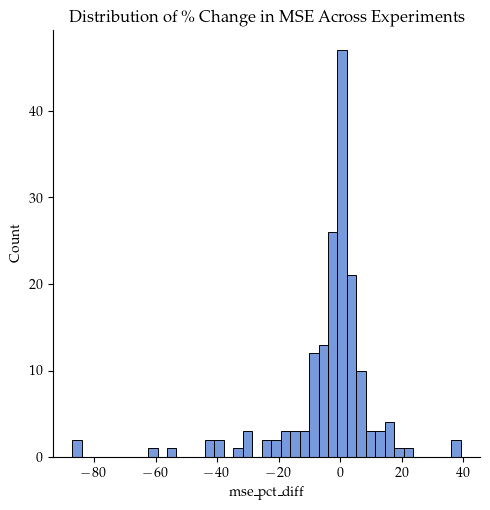

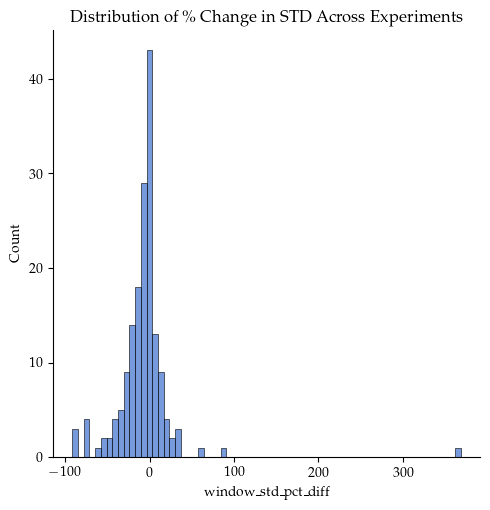

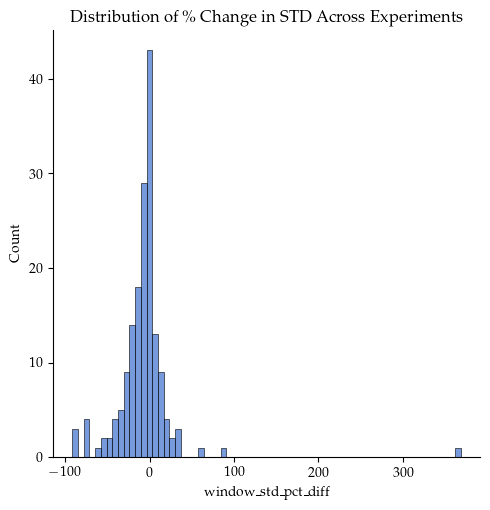

In [58]:
pd.set_option('display.max_rows',None)

g = sns.displot(pct_diffs_all_ds.sort_values('mse_pct_diff',ascending=True).mse_pct_diff)
plt.title("Distribution of \% Change in MSE Across Experiments")
plt.show()
g = sns.displot(pct_diffs_all_ds.sort_values('window_std_pct_diff',ascending=True).window_std_pct_diff)
plt.title("Distribution of \% Change in STD Across Experiments")
plt.show()
# g = sns.displot(pct_diffs_all_ds.sort_values('mcv_pct_diff',ascending=True).mcv_pct_diff)
# plt.title("Distribution of % Change in MCV Across Experiments")

g = sns.displot(pct_diffs_all_ds.sort_values('monotonic_rate_pct_diff',ascending=True).window_std_pct_diff)
plt.title("Distribution of \% Change in STD Across Experiments")
plt.show()

### PAPER?: Heatmap dataset vs model improvement

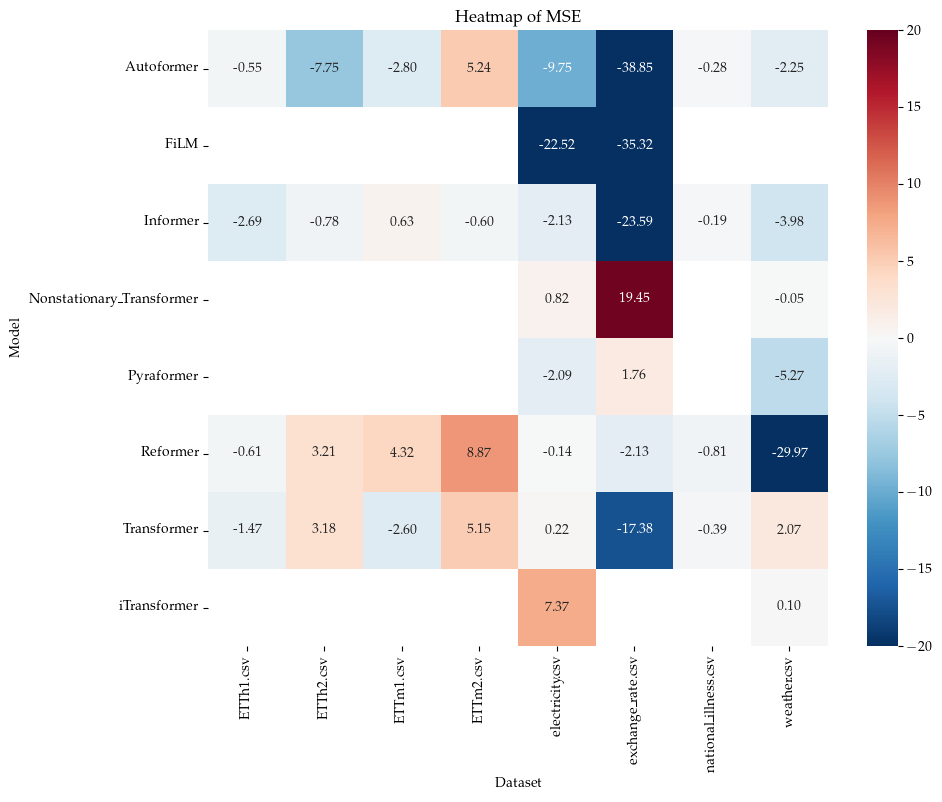

<Figure size 640x480 with 0 Axes>

In [51]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming pct_diffs_all_ds is your dataset, you would load it into a DataFrame. For demonstration, here's how you'd read it from a CSV file:

# Here, you would replace the next line with your actual data variable
# For example: df = pct_diffs_all_ds

# Pivot the DataFrame to format it for the heatmap

heatmap_data = pct_diffs_all_ds.groupby(["model", "data_path"]).mean().reset_index().pivot("model", "data_path", "mse_pct_diff")

# Plotting the heatmap
plt.figure(figsize=(10, 8))
from matplotlib.colors import LinearSegmentedColormap
#green_red = LinearSegmentedColormap.from_list("green_red", ["green", "red"])
#sns.heatmap(heatmap_data, annot=True, cmap=green_red, fmt=".2f",center=0)
sns.heatmap(heatmap_data, annot=True, cmap='RdBu_r', fmt=".2f",center=0,vmin=-20,vmax=20)
plt.title('Heatmap of MSE % Difference (ERM vs Constrained) by Model and Dataset')
plt.ylabel('Model')
plt.xlabel('Dataset')
plt.show()
# Write out into the figures folder
plt.savefig(f"{FIGURES_FOLDER}/heatmap_mse_pct_diff.png")

## Pivot tables (resilience) (TEMP)

In [59]:
def style_pivot_table_best_per_params(pivoted_df):
    pivoted_df=pivoted_df.copy()
    pivoted_df.columns.names = ['metric','type','model']
    mask = pd.DataFrame(False, index=pivoted_df.index, columns=pivoted_df.columns)
    for keys,subset in  pivoted_df.groupby(level=['metric','model'],axis=1):
        mask.loc[:,subset.columns] = subset.eq(subset.min(axis=1), axis=0)
        
    ##STYLE
    # truncate to 4 decimals for display
    pivoted_df=pivoted_df.style.format("{:.4f}")
    pivoted_df=pivoted_df.apply(lambda s: ['font-weight: bold;text-decoration: underline' if v else '' for v in mask.loc[s.name]], axis=1)
    return pivoted_df

def data_path_renaming(x):
    if x=="exchange_rate.csv":
        x='Exchange'
    x=x.replace(".csv","")
    if x=="electricity":
        x="ECL"
    else: 
        x=x.replace(".csv","").replace("_"," ").title()
    return latex_scaffolding_dataset(x)
def latex_scaffolding_dataset(x):
    # Add rotatebox
    x=r'\rotatebox'+'{90}{'+x+'}'
    x=r'\multirow{4}{*}{'+x+'}'
    return x
def text_bf(x):
    return r'\textbf{'+x+'}'
def latex_style_best(pivoted_df):#TODO broken
    pivoted_df=pivoted_df.copy()
    pivoted_df.columns.names = ['metric','type','model']
    mask = pd.DataFrame(False, index=pivoted_df.index, columns=pivoted_df.columns)
    for keys,subset in  pivoted_df.groupby(level=['metric','model'],axis=1):
        mask.loc[:,subset.columns] = subset.eq(subset.min(axis=1), axis=0)
    #if mask is true, add text_bf
    pivoted_df=pivoted_df.apply(lambda s: [text_bf(v) if v else '' for v in mask.loc[s.name]], axis=1)
    return pivoted_df


pd.set_option('display.max_columns', None)
def compute_pivot_over_metric(summary_metrics,pivot_value_columns=['window_std'],split='test'):
    pivoted_tables=[]
    data_paths=summary_metrics.data_path.unique()
    for data_path in data_paths:
        tp2=summary_metrics.query(f'data_path==@data_path and split==@split').copy()

        #GROUPING TEH VALS
        grouped_values=tp2.groupby(['pred_len','model','type'])[[
            'mse',
            'mcv',
            'std_mse',
            'std_mcv',
            'mean_infeasible_rate',
            'std_infeasible_rate',
            'window_std'
            ]].mean().reset_index()
        
        # Pivot of models versus constrained and ERM, values are mse and mse_diff
        all_results = grouped_values
        
        # Pivot all results, sort ascending by pred_len, then mean_violation on constrained
        pivoted=all_results.pivot(
            index=['pred_len'],
            columns=['type','model'], 
            values=pivot_value_columns
        )
        
        pivoted=style_pivot_table_best_per_params(pivoted)
        #display(pivoted)
        pivoted_tables.append(pivoted)
    result_table = pd.concat([d.data for d in pivoted_tables],keys=data_paths,names=['data_path'])

    return result_table
display(Markdown(f"# Pivot tables for split=test"))
for metric in [
    'mse',
    'mcv',
    #'mean_infeasible_rate',
    #'window_std',
    ]:
    result_table = compute_pivot_over_metric(summary_metrics,pivot_value_columns=[metric],split='test')
    display(Markdown(f"## {metric}"))
    # add bold
    display(style_pivot_table_best_per_params(result_table))
    #latex styling
    latex_table=result_table.copy()

    latex_table.index=latex_table.index \
        .set_levels([data_path_renaming(level) for level in latex_table.index.levels[0]],level=0)

    #TODO FIX the styling function to add textbf
    #latex_table=latex_style_best(latex_table)
    # drop the metric level in the multiindex
    latex_table.columns=latex_table.columns.droplevel(0)

    # Swap the column multiindex to model on top
    latex_table=latex_table.swaplevel(0,1,axis=1)

    #latex_table=style_pivot_table_best_per_params(latex_table)
    # Show only :.4f
    latex_table=latex_table.applymap(lambda x: f"{x:.4f}")
    # Rename data_path to None
    latex_table=latex_table.rename_axis(index={'data_path':None,'pred_len':''},columns={'model':'','type':''})
    #display(latex_table.columns)
    # refactor the multiindex in columns so that repeated models merge
    #print(latex_table.to_latex(escape=False,index_names=False,multicolumn_format='c',multicolumn=True))
    print(latex_table.to_latex(escape=False,multicolumn_format='c',multicolumn=True))


# Pivot tables for split=test

## mse

\begin{tabular}{llllllllllllllllll}
\toprule
                                         &     &  Autoformer &        FiLM &    Informer & Nonstationary_Transformer &  Pyraformer &    Reformer & Transformer & iTransformer & Autoformer &    FiLM & Informer & Nonstationary_Transformer & Pyraformer & Reformer & Transformer & iTransformer \\
                                         &     & Constrained & Constrained & Constrained &               Constrained & Constrained & Constrained & Constrained &  Constrained &        ERM &     ERM &      ERM &                       ERM &        ERM &      ERM &         ERM &          ERM \\
{} & {} &             &             &             &                           &             &             &             &              &            &         &          &                           &            &          &             &              \\
\midrule
\multirow{4}{*}{\rotatebox{90}{Etth1}} & 96  &      0.7240 &         nan &      0.8843 &                     

## mcv

\begin{tabular}{llllllllllllllllll}
\toprule
                                         &     &  Autoformer &        FiLM &    Informer & Nonstationary_Transformer &  Pyraformer &    Reformer & Transformer & iTransformer & Autoformer &    FiLM & Informer & Nonstationary_Transformer & Pyraformer & Reformer & Transformer & iTransformer \\
                                         &     & Constrained & Constrained & Constrained &               Constrained & Constrained & Constrained & Constrained &  Constrained &        ERM &     ERM &      ERM &                       ERM &        ERM &      ERM &         ERM &          ERM \\
{} & {} &             &             &             &                           &             &             &             &              &            &         &          &                           &            &          &             &              \\
\midrule
\multirow{4}{*}{\rotatebox{90}{Etth1}} & 96  &      0.4340 &         nan &      0.6143 &                     

### Comparing variance and CoV ERM vs constrained

In [ ]:
# Calculate mean and std for mse and constraint_violation. Rename them mean_{metric} and std_{metric
#ToDO filter one seeed and split
stepwise_metrics = df_to_plot[df_to_plot.constraint_idx.isin([0,2])].query("split=='test'").groupby([
    "run_id",
    "Algorithm", #Harmless carryover col for legacy purposes (verified the counts are the same)
    "model",'type',
    "constraint_level",
    "constraint_idx",
    "pred_len",
    "data_path",
    "split",
    'step'#STEPWISE
    ])['mse','constraint_violation','infeasible_rate','run_id'].aggregate(
        mse=('mse','mean'),
        #std_mse=('mse','std'),
        mcv=('constraint_violation','mean'),
        #std_mcv=('constraint_violation','std'),
        mean_infeasible_rate=('infeasible_rate','mean'),
        #std_infeasible_rate=('infeasible_rate','std'),
        run_count=('run_id','nunique')
        ).reset_index().round(5)
summary_stepwise=stepwise_metrics.groupby([
    "run_id",
    "Algorithm", #Harmless carryover col for legacy purposes (verified the counts are the same)
    "model",
    'type',
    "constraint_level",
    "constraint_idx",
    "pred_len",
    "data_path",
    "split"]).aggregate(
        mse=('mse','mean'),
        std_mse=('mse','std'),
        mcv=('mcv','mean'),
        std_mcv=('mcv','std'),
        mean_infeasible_rate=('mean_infeasible_rate','mean'),
        std_infeasible_rate=('mean_infeasible_rate','std'),
        run_count=('run_count','mean'),
        step_count=('step','count')
    ).reset_index()
summary_stepwise

In [ ]:
summary_stepwise.groupby(['run_id','type','constraint_idx',"Algorithm","model"]).size().reset_index()

In [ ]:
dd_weather = summary_stepwise.query('data_path=="weather.csv" and pred_len==96').copy()
dd_weather.groupby(['run_id','constraint_idx',"Algorithm","model","constraint_idx"])
#dd_weather.pivot(index=['run_id','constraint_idx',"Algorithm","model","constraint_idx"], columns='type', values='mse')

#### Pivot tables stepwise

In [ ]:
#Note, variance is nan because there is only one run per parameter set
weather = summary_stepwise.query('data_path=="weather.csv"').copy()
electricity = summary_stepwise.query('data_path=="electricity.csv"').copy()
for name,dataset in [('weather',weather), ('electricity',electricity)]:
    display(Markdown(f"# {name}"))
    tp2=dataset.copy(deep=True)
    #tp2=weather.query('split=="test"').copy()
    # Compute 'infeasible amount' as the difference between the mse and the constraint_level, 0 if mse < constraint
    
    # Split into constrained and ERM
    tp2_constrained=tp2.query('type=="Constrained"').copy()
    tp2_erm_baseline=tp2.query('type=="ERM"').copy()

    distinct_constraints = tp2_constrained[['pred_len','model','constraint_level']].drop_duplicates()

    #GROUPING TEH VALS
    grouped_values=tp2.groupby(['pred_len','constraint_level','constraint_idx','model','type'])[[
        'mse','mcv',
        'std_mse','std_mcv',
        'mean_infeasible_rate','std_infeasible_rate']].mean().reset_index()

    # Pivot of models versus constrained and ERM, values are mse and mse_diff
    all_results = grouped_values#pd.concat([grouped_constrained,grouped_erm_baseline_broadcasted],axis=0)
    # Pivot all results, sort ascending by pred_len, then mean_violation on constrained

    pivoted=all_results.pivot(
        #index=['pred_len','constraint_idx'], 
        index=['pred_len'], 
        columns=['type','model'],
        values=['mse','std_mse','mcv','std_mcv','mean_infeasible_rate','std_infeasible_rate']
    ).query('constraint_level>0').round(4)
    simplified = all_results.pivot(
        index=['pred_len','constraint_level'],
        columns=['type','model'],
        values=['mse','mcv']
    )
    pd.set_option('display.max_columns', None)
    print("SIMPLIFIED 192 MSE")
    # show all pred lengths (index)
    for pred_len in [96, 192, 336, 720]:    
        print(simplified.index.get_level_values(0).unique())
        simp_mse_192=simplified[simplified.index.get_level_values(0)==pred_len][['mse']]
        sim_mcv_192=simplified[simplified.index.get_level_values(0)==pred_len][['mcv']]

        # Flatten the multiindex
        def prettify(d):
            d = d.copy()
            d.columns = d.columns.map('_'.join)
            return d.style.format(precision=3)
        # display(prettify(simp_mse_192))
        print(f"SIMPLIFIED {pred_len} MCV")
        display(prettify(sim_mcv_192))
    print("FULL")
    display(pivoted)
    #reformer works best on weather.

## Pivots per dataset

# DEBUGGING WTF

In [ ]:
# filter df_to_plot and summary_metrics to only include autoformer exchange 96 test
summary_debug = summary_metrics.query('model=="Autoformer" and data_path=="exchange_rate.csv" and pred_len==720 and split=="test"').copy()
df_debug = df_to_plot.query('model=="Autoformer" and data_path=="exchange_rate.csv" and pred_len==720 and split=="test"').copy()

display(summary_debug)
display(df_debug.shape)
sns.scatterplot(df_debug,x='step',y='mse',hue='constraint_type')

In [ ]:
df_debug.groupby(['split'])['mse'].mean()